# Projet P4 : Anticipez les besoins en consommation de bâtiments - Analyse exploratoire

## Contexte

Vous travaillez pour la ville de Seattle. Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, votre équipe s’intéresse de près à la consommation et aux émissions des bâtiments non destinés à l’habitation.

Des relevés minutieux ont été effectués par les agents de la ville en 2016. Voici les données et leur source. https://data.seattle.gov/Permitting/2016-Building-Energy-Benchmarking/2bpz-gwpy/about_data

Cependant, ces relevés sont coûteux à obtenir, et à partir de ceux déjà réalisés, vous voulez tenter de prédire les émissions de CO2 et la consommation totale d’énergie de bâtiments non destinés à l’habitation pour lesquels elles n’ont pas encore été mesurées.

Votre prédiction se basera sur les données structurelles des bâtiments (taille et usage des bâtiments, date de construction, situation géographique, ...)

Vous cherchez également à évaluer l’intérêt de l’"ENERGY STAR Score" pour la prédiction d’émissions (expliqué sur ce site en anglais : www.energystar.gov), https://www.energystar.gov/?s=mega
qui est fastidieux à calculer avec l’approche utilisée actuellement par votre équipe. Vous l'intégrerez dans la modélisation et jugerez de son intérêt.

Vous sortez tout juste d’une réunion de brief avec votre équipe. Voici un récapitulatif de votre mission :

Réaliser une courte analyse exploratoire.
Tester différents modèles de prédiction afin de répondre au mieux à la problématique.
Avant de quitter la salle de brief, Douglas, le project lead, vous donne quelques pistes et erreurs à éviter :

Douglas : L’objectif est de te passer des relevés de consommation annuels futurs (attention à la fuite de données). Nous ferons de toute façon pour tout nouveau bâtiment un premier relevé de référence la première année, donc rien ne t'interdit d’en déduire des variables structurelles aux bâtiments, par exemple la nature et proportions des sources d’énergie utilisées.. 

Fais bien attention au traitement des différentes variables, à la fois pour trouver de nouvelles informations (peut-on déduire des choses intéressantes d’une simple adresse ?) et optimiser les performances en appliquant des transformations simples aux variables (normalisation, passage au log, etc.).

Mets en place une évaluation rigoureuse des performances, et optimise les hyperparamètres et le choix d’algorithmes de ML à l’aide d’une validation croisée. Tu testeras au minimum 4 algorithmes de famille différente (par exemple : ElasticNet, SVM, GradientBoosting, RandomForest).

## Etapes du projet :

Des relevés de consommations et émissions des bâtiments non destinés à l’habitation ont été effectués par les agents de la ville en 2016. A partir de ces relevé, vous voulez tenter de prédire les émissions de CO2 et la consommation totale d’énergie de bâtiments non destinés à l’habitation pour lesquels ces données n'ont pas été mesurées.

- <b> Etape préliminaire : </b> Importation des données et description des fichiers ( --> NoteBook1 : Analyse exploratoire )
- <b> Etape 1 : </b> Analyse exploratoire des datasets et premiers feature engineering ( --> NoteBook1 : Analyse exploratoire ) 
- <b> Etape 2 : </b> Développement et simulation d'un premier modèle ( --> NoteBook2 : Implémentation modèle )
- <b> Etape 3 : </b> Amélioration du feature engineering ( --> NoteBook2 : Implémentation modèle )
- <b> Etape 4 : </b> Simulation d'autres modèles et choix du modèle final ( --> NoteBook2 : Implémentation modèle )
- <b> Etape 5 : </b> Analyse de la "feature importance" globale et locale ( --> NoteBook2 : Implémentation modèle )
- <b> Etape 6 : </b> Analyse de l'influence de l'EnergyStarScore ( --> NoteBook2 : Implémentation modèle )
- <b> Etape 7 : </b> Simulation de la 2ème target ( --> NoteBook3 : Modèle 2e target )

## Etape préliminaire : Importation des données et description des fichiers

ETAPE 0
- collecter et préparer les données brutes dans un dataframe 
- mettre en place un environnement de travail configuré avec les bibliothèques de traitement de données et de machine learning

### Environnement de travail et librairies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import scipy.stats as st
# Pour l'analyse des valeurs manquantes - installation du package via anaconda navigator
import missingno as msno
import folium # Pour les représentations de cartes
import branca.colormap as cm
# Pour adapter les étiquettes de texte sur les graphs
from adjustText import adjust_text
# Pour formater les chiffres sur un axe d'un graphique en notation scientifique
from matplotlib.ticker import ScalarFormatter

from tabulate import tabulate
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
# Pour l'imputation des valeurs manquantes
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
# Pour centrer-réduire les données
from sklearn import decomposition
# Calcul du logarithme
from math import log
from branca.colormap import linear
from datetime import datetime
from sklearn.feature_extraction import DictVectorizer

sns.set_palette('Set3')

### Importation des données

In [2]:
building_energy = pd.read_csv("C:\\Users\\druar\\OneDrive\\Documents\\01_Formations\\1_Outils_ET_Metier\\2024_DataScientist\\ProjetsPython\\P4\\data\\2016_Building_Energy_Benchmarking.csv", sep=',')
building_energy.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,...,Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,...,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,...,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,...,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,...,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,...,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [3]:
# Taille de la table :
building_energy.shape
# 46 variables et 3376 batiments

(3376, 46)

## ETAPE 1 : Analyse exploratoire des datasets et premiers feature engineering

ETAPE 1
1. Filtre sur les bâtiments non résidentiels
2. Analyse macro des données pour comprendre les variables et identifier les variables utiles 
3. Analyse descriptives des variables (identifier les valeurs aberrantes, zéros, incohérences)
4. Choix des deux cibles pour les prédictions
5. Fonction de nettoyage du dataset pour supprimer les variables inutiles et filtrer sur les bâtiments pertinents
6. Feature engineering : traitement des valeurs manquantes, transformations de variables, création de nouvelles caractéristiques
7. Explorez les relations potentielles entre les variables et les cibles
8. Enregistrer le dataframe qui va entrer dans le modèle

In [4]:
# Liste et type des variables :
liste_var=building_energy.dtypes
print(liste_var)

OSEBuildingID                        int64
DataYear                             int64
BuildingType                        object
PrimaryPropertyType                 object
PropertyName                        object
Address                             object
City                                object
State                               object
ZipCode                            float64
TaxParcelIdentificationNumber       object
CouncilDistrictCode                  int64
Neighborhood                        object
Latitude                           float64
Longitude                          float64
YearBuilt                            int64
NumberofBuildings                  float64
NumberofFloors                       int64
PropertyGFATotal                     int64
PropertyGFAParking                   int64
PropertyGFABuilding(s)               int64
ListOfAllPropertyUseTypes           object
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
SecondLarge

### 1. Filtre sur les bâtiments non résidentiels

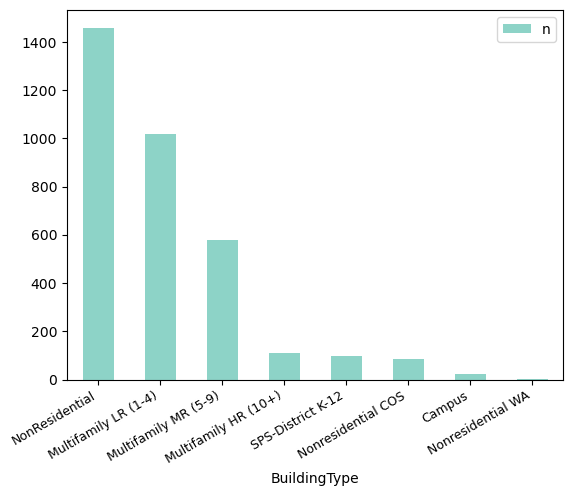

In [5]:
# Aperçu de la variable type de building :
effectifs = building_energy['BuildingType'].value_counts()
modalites = effectifs.index # l'index de effectifs contient les modalités
tab = pd.DataFrame(modalites, columns = ['BuildingType']) # Création du tableau à partir des modalités
tab["n"] = effectifs.values
tab.plot(kind='bar',y='n',x='BuildingType')
plt.xticks(rotation=30, fontsize=9, ha='right')
# plt.legend(None)
plt.show()

In [6]:
types = ['NonResidential','Nonresidential COS','Nonresidential WA','SPS-District K-12']
# SPS = Seattle Public Schools
building_energy = building_energy[building_energy['BuildingType'].isin(types)].copy()
building_energy.drop(columns=['BuildingType'], inplace=True)
building_energy.shape

(1644, 45)

### 2. Analyse macro des données

#### --> Types de variables présentes dans le fichier

In [7]:
# Type des variables :
types_variables = building_energy.dtypes

# Compter le nombre de variables par catégorie
nombre_variables_par_categorie = types_variables.value_counts()

# Afficher le résultat
print(nombre_variables_par_categorie)

float64    22
object     14
int64       8
bool        1
Name: count, dtype: int64


#### --> Aperçue des variables qualitatives

--------------------
PrimaryPropertyType
count                            1644
unique                             22
top       Small- and Mid-Sized Office
freq                              292
Name: PrimaryPropertyType, dtype: object
Nombre de valeurs manquantes de la variable PrimaryPropertyType : 0


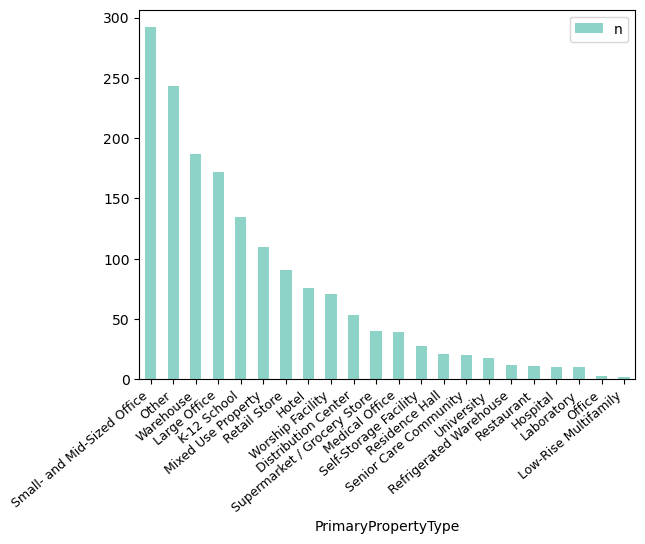

--------------------
City
count        1644
unique          1
top       Seattle
freq         1644
Name: City, dtype: object
Nombre de valeurs manquantes de la variable City : 0


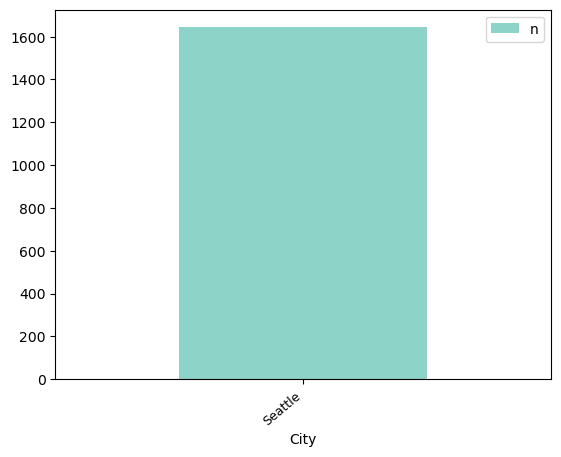

--------------------
State
count     1644
unique       1
top         WA
freq      1644
Name: State, dtype: object
Nombre de valeurs manquantes de la variable State : 0


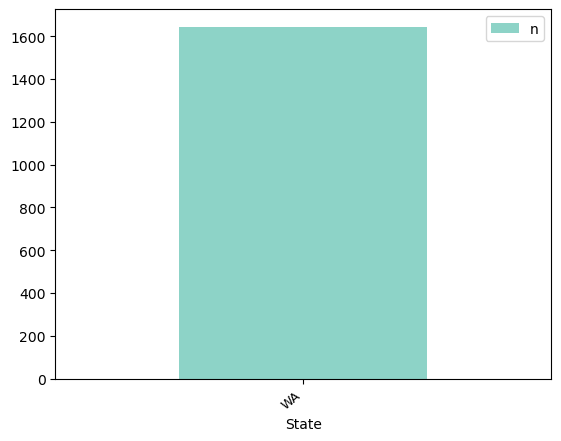

--------------------
Neighborhood
count         1644
unique          19
top       DOWNTOWN
freq           355
Name: Neighborhood, dtype: object
Nombre de valeurs manquantes de la variable Neighborhood : 0


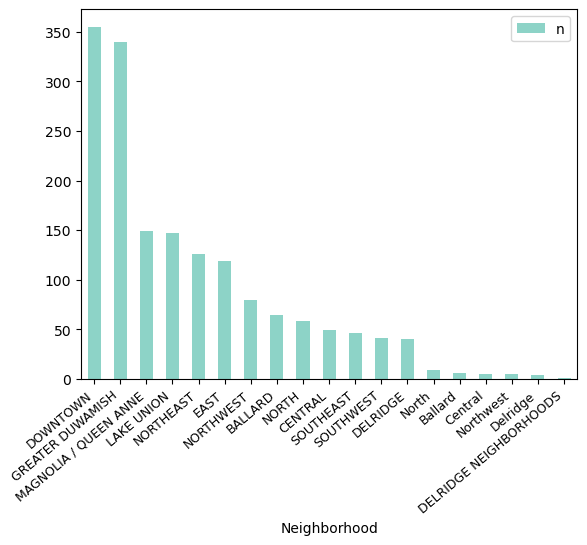

--------------------
LargestPropertyUseType
count       1638
unique        56
top       Office
freq         495
Name: LargestPropertyUseType, dtype: object
Nombre de valeurs manquantes de la variable LargestPropertyUseType : 6


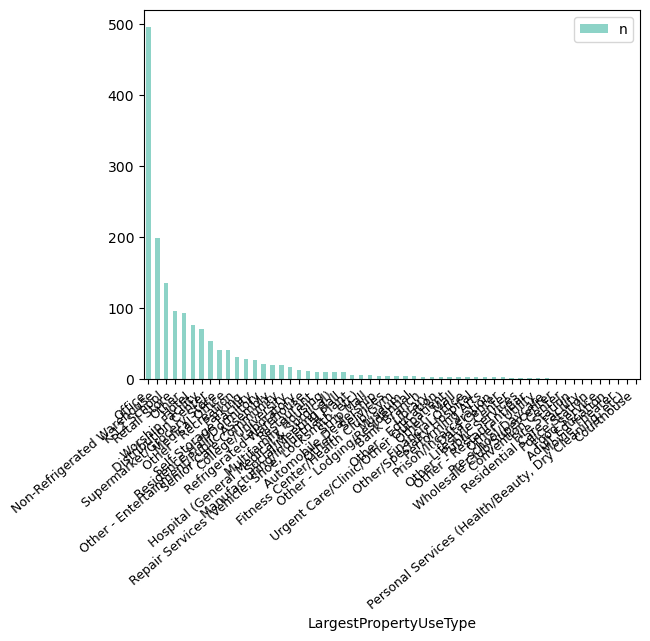

--------------------
SecondLargestPropertyUseType
count         844
unique         47
top       Parking
freq          332
Name: SecondLargestPropertyUseType, dtype: object
Nombre de valeurs manquantes de la variable SecondLargestPropertyUseType : 800


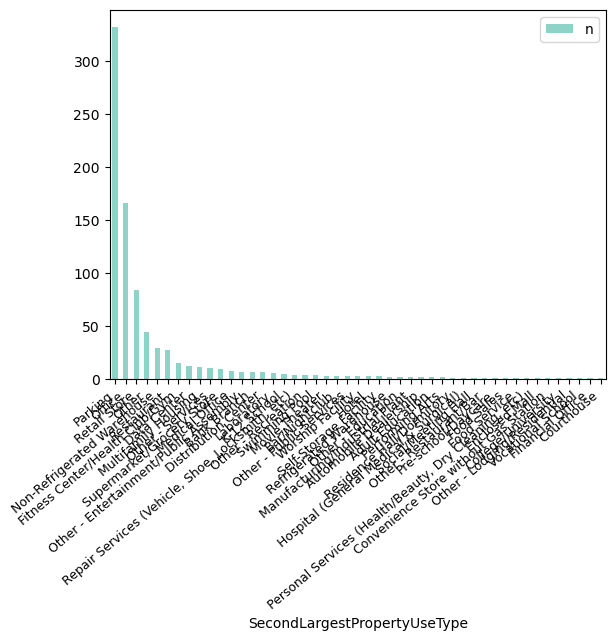

--------------------
ThirdLargestPropertyUseType
count        346
unique        38
top       Office
freq          48
Name: ThirdLargestPropertyUseType, dtype: object
Nombre de valeurs manquantes de la variable ThirdLargestPropertyUseType : 1298


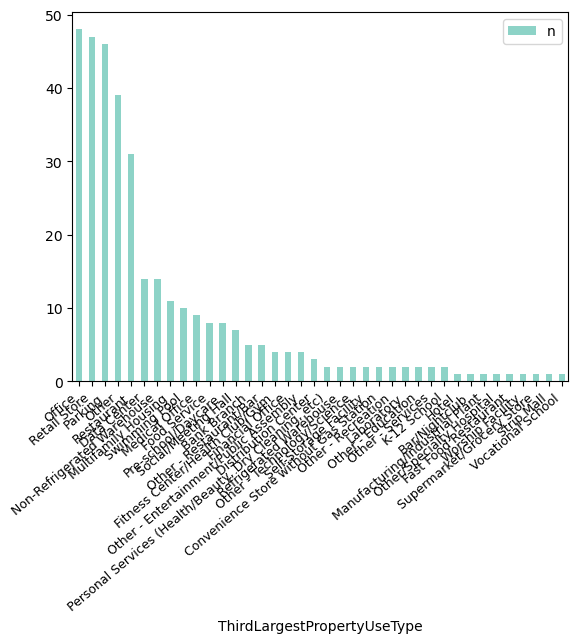

--------------------
YearsENERGYSTARCertified
count       98
unique      64
top       2016
freq        12
Name: YearsENERGYSTARCertified, dtype: object
Nombre de valeurs manquantes de la variable YearsENERGYSTARCertified : 1546


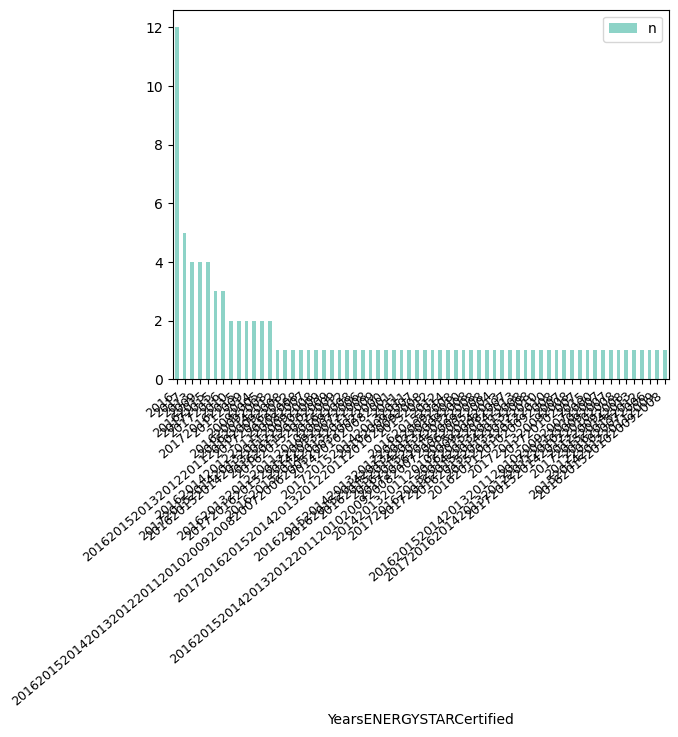

--------------------
DefaultData
count      1644
unique        2
top       False
freq       1556
Name: DefaultData, dtype: object
Nombre de valeurs manquantes de la variable DefaultData : 0


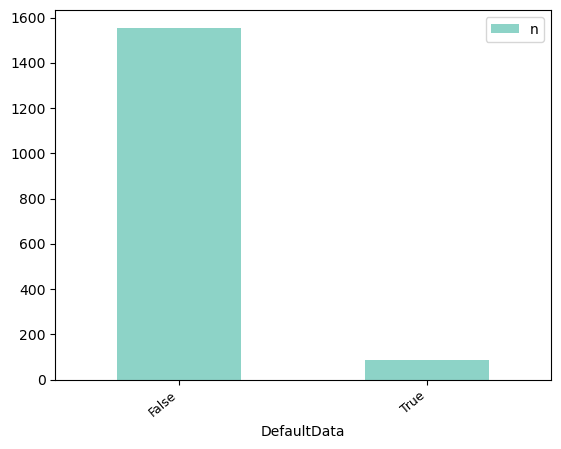

--------------------
ComplianceStatus
count          1644
unique            4
top       Compliant
freq           1524
Name: ComplianceStatus, dtype: object
Nombre de valeurs manquantes de la variable ComplianceStatus : 0


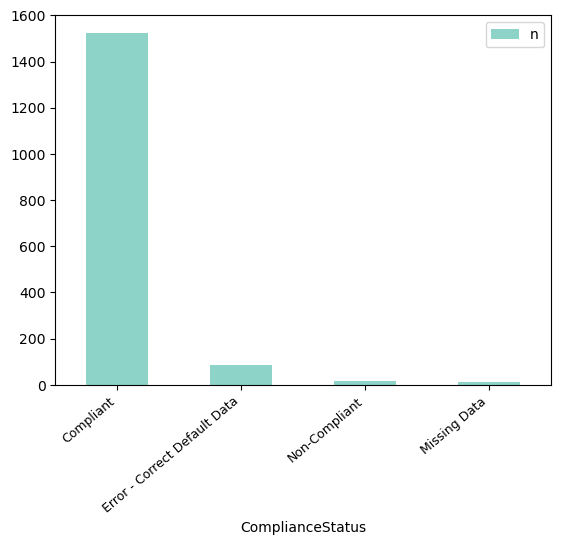

--------------------
Outlier
count              17
unique              2
top       Low outlier
freq               15
Name: Outlier, dtype: object
Nombre de valeurs manquantes de la variable Outlier : 1627


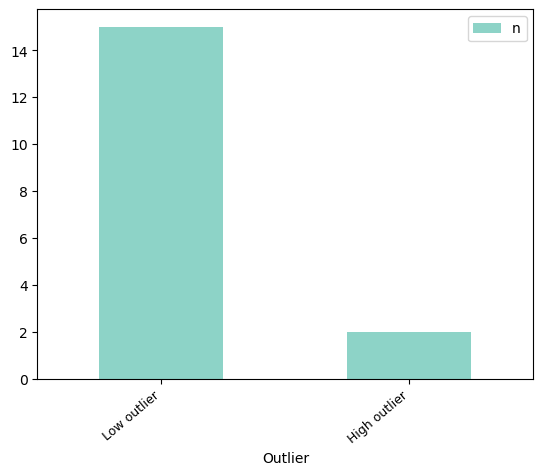

In [8]:
variables_object = building_energy.select_dtypes(include=['object', 'bool']).columns.tolist()
variables = [var for var in variables_object if var not in ['PropertyName','Address','TaxParcelIdentificationNumber','ListOfAllPropertyUseTypes']]
# Afficher un résumé et un bar plot pour chaque variable catégorielle :
for variable in variables:
    print("-"*20)
    print(variable)
    print(building_energy[variable].describe())
    nombre_valeurs_manquantes = building_energy[variable].isnull().sum()
    print(f"Nombre de valeurs manquantes de la variable {variable} : {nombre_valeurs_manquantes}")
    effectifs = building_energy[variable].value_counts()
    modalites = effectifs.index # l'index de effectifs contient les modalités
    tab = pd.DataFrame(modalites, columns = [variable]) # Création du tableau à partir des modalités
    tab["n"] = effectifs.values
    tab.plot(kind='bar',y='n',x=variable)
    plt.xticks(rotation=40, fontsize=9, ha='right')
    plt.show()

<b> 15 variables - 1644 batiments </b>

Variables à supprimer : 
- 'State' = WA une seule modalité
- 'City' = Seattle une seule modalité
- 'ListOfAllPropertyUseTypes' : 365 valeurs uniques texte = liste de tous les types d'utilisations qui peuvent être fait du bâtiment ? 2 valeurs manquantes
- 'TaxParcelIdentificationNumber' : Numéro d'identification de parcelle fiscale, 1565 valeurs uniques plusieurs chiffres, 0 valeurs manquantes

Variables catégorielles exploitables : 
- 'PrimaryPropertyType' : 22 modalités type de batiment (hotel, magasin,etc), 0 valeurs manquantes
- 'Neighborhood' : 19 modalités localités (east, ballard, etc.), 0 valeur manquantes
- 'LargestPropertyUseType' : 56 modalités utilisation majoritaire du batîment, 6 valeurs manquantes
--> fait référence au type d'utilisation principal d'un bâtiment, c'est-à-dire l'activité ou la fonction principale pour laquelle le bâtiment est utilisé.
- 'SecondLargestPropertyUseType' : 47 modalités 2e utilisation majoritaire, 800 valeurs manquantes
- 'ThirdLargestPropertyUseType' : 38 modalités 3e utilisation majoritaire, 1298 valeurs manquantes

Variables spécifique pour chaque batiment :
- 'PropertyName' : 1641 valeurs uniques texte, 0 valeurs manquantes
- 'Adress' : 1623 valeurs uniques adresse texte, 0 valeurs manquantes

Autres (à supprimer ?) : 
- 'YearsENERGYSTARCertified' : 64 modalités uniques, liste d'année, 1546 valeurs manquantes
- 'DefaultData' : valeurs False/True, majorité à False, 0 valeurs manquantes
- 'ComplianceStatus' : 4 modalités, compliante (1524), non compliante, error, missing, 0 valeurs manquantes
- 'Outlier' : 2 modalités low outlier (15), high outlier (2), 1627 valeurs manquantes

#### --> Aperçue des variables quantitatives

--------------------
ZipCode
count     1628.000000
mean     98116.876536
std         18.492115
min      98006.000000
25%      98105.000000
50%      98109.000000
75%      98125.000000
max      98199.000000
Name: ZipCode, dtype: float64
Nombre de valeurs manquantes de la variable ZipCode : 16
moy:
 98116.87653562654
med:
 98109.0
mod:
 0    98134.0
Name: ZipCode, dtype: float64
Q_99:
 98199.0
var:
 341.7482700620011
ect:
 18.486434758005696
skw:
 1.3045787081084383
kur:
 8.839881569214578


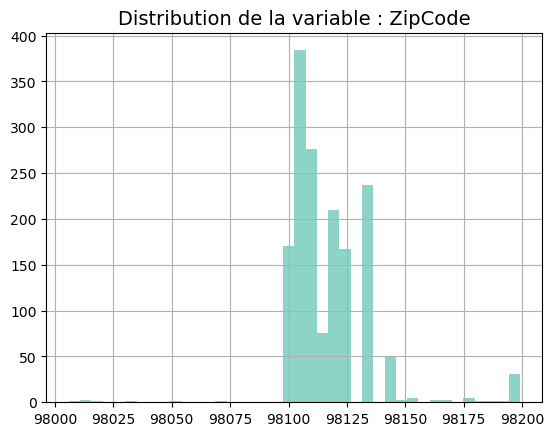

--------------------
Latitude
count    1644.000000
mean       47.616246
std         0.048141
min        47.499170
25%        47.585515
50%        47.612480
75%        47.649752
max        47.733870
Name: Latitude, dtype: float64
Nombre de valeurs manquantes de la variable Latitude : 0
moy:
 47.61624645363139
med:
 47.612480000000005
mod:
 0    47.66246
Name: Latitude, dtype: float64
Q_99:
 47.7258653
var:
 0.002316125612764176
ect:
 0.048126142716450646
skw:
 0.23069119418463524
kur:
 -0.223942101507006


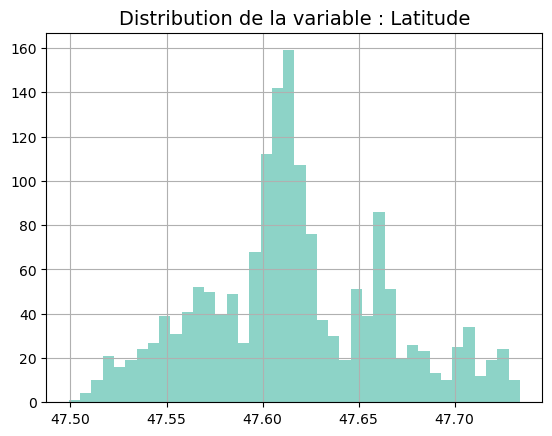

--------------------
Longitude
count    1644.000000
mean     -122.332957
std         0.024615
min      -122.411820
25%      -122.343290
50%      -122.332935
75%      -122.321748
max      -122.258640
Name: Longitude, dtype: float64
Nombre de valeurs manquantes de la variable Longitude : 0
moy:
 -122.33295749294405
med:
 -122.33293499999999
mod:
 0   -122.29898
Name: Longitude, dtype: float64
Q_99:
 -122.2698617
var:
 0.0006055354501132901
ect:
 0.024607629916619154
skw:
 -0.0748034538258497
kur:
 0.7387203284669583


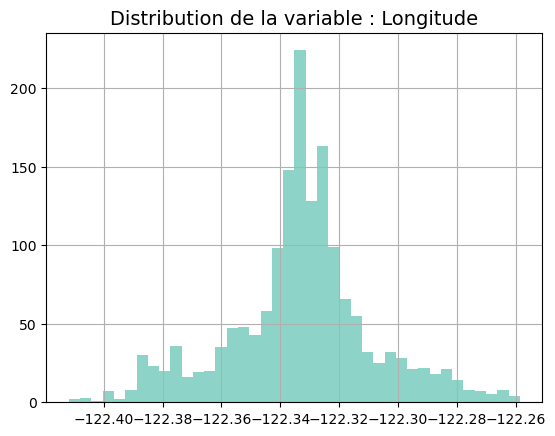

--------------------
NumberofBuildings
count    1642.000000
mean        1.034105
std         0.552039
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         9.000000
Name: NumberofBuildings, dtype: float64
Nombre de valeurs manquantes de la variable NumberofBuildings : 2
moy:
 1.0341047503045067
med:
 1.0
mod:
 0    1.0
Name: NumberofBuildings, dtype: float64
Q_99:
 3.0
var:
 0.3045615919506336
ect:
 0.5518709921264512
skw:
 8.264400893360703
kur:
 89.50762275283655


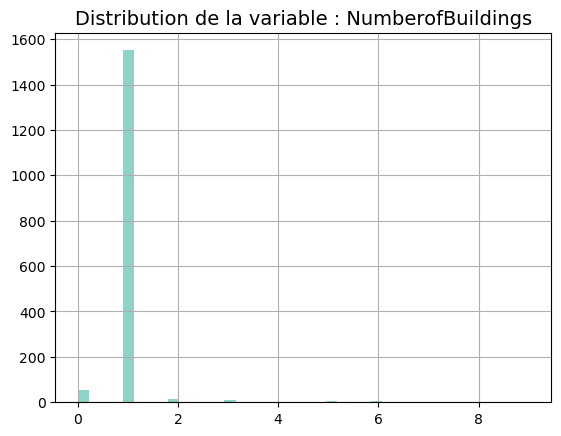

--------------------
LargestPropertyUseTypeGFA
count    1.638000e+03
mean     9.052103e+04
std      1.523614e+05
min      5.656000e+03
25%      2.550000e+04
50%      4.339400e+04
75%      8.962225e+04
max      1.680937e+06
Name: LargestPropertyUseTypeGFA, dtype: float64
Nombre de valeurs manquantes de la variable LargestPropertyUseTypeGFA : 6
moy:
 90521.02625152626
med:
 43394.0
mod:
 0    24000.0
1    30000.0
Name: LargestPropertyUseTypeGFA, dtype: float64
Q_99:
 853092.5999999917
var:
 23199827378.750854
ect:
 152314.89545921257
skw:
 5.213559402458826
kur:
 35.865887259386824


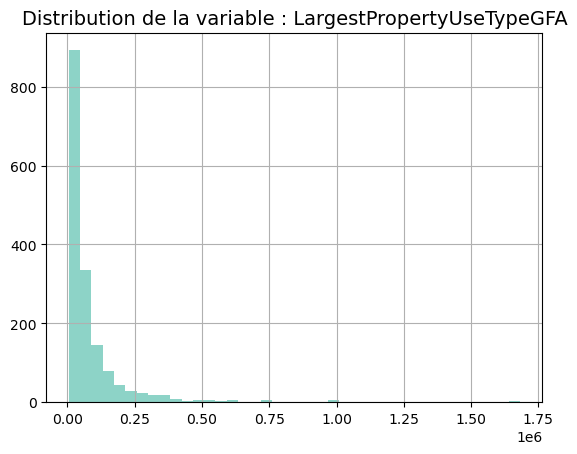

--------------------
SecondLargestPropertyUseTypeGFA
count       844.000000
mean      35711.875944
std       66238.423870
min           0.000000
25%        5295.000000
50%       12000.000000
75%       31447.500000
max      686750.000000
Name: SecondLargestPropertyUseTypeGFA, dtype: float64
Nombre de valeurs manquantes de la variable SecondLargestPropertyUseTypeGFA : 800
moy:
 35711.87594417061
med:
 12000.0
mod:
 0    0.0
Name: SecondLargestPropertyUseTypeGFA, dtype: float64
Q_99:
 337424.65999999957
var:
 4382330302.9136505
ect:
 66199.17146697268
skw:
 3.9780494919251326
kur:
 21.171041386140033


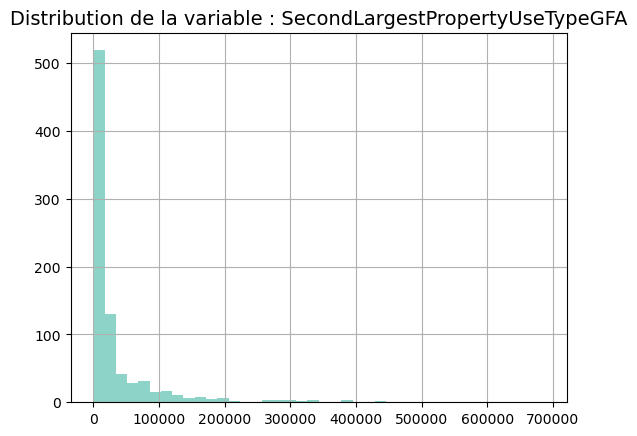

--------------------
ThirdLargestPropertyUseTypeGFA
count       346.000000
mean      13468.402886
std       27959.956890
min           0.000000
25%        2642.000000
50%        5806.000000
75%       12356.500000
max      303910.000000
Name: ThirdLargestPropertyUseTypeGFA, dtype: float64
Nombre de valeurs manquantes de la variable ThirdLargestPropertyUseTypeGFA : 1298
moy:
 13468.402886369944
med:
 5806.0
mod:
 0    0.0
Name: ThirdLargestPropertyUseTypeGFA, dtype: float64
Q_99:
 137916.6000000001
var:
 779499769.6583169
ect:
 27919.523091527135
skw:
 5.987609242003775
kur:
 47.07773691952696


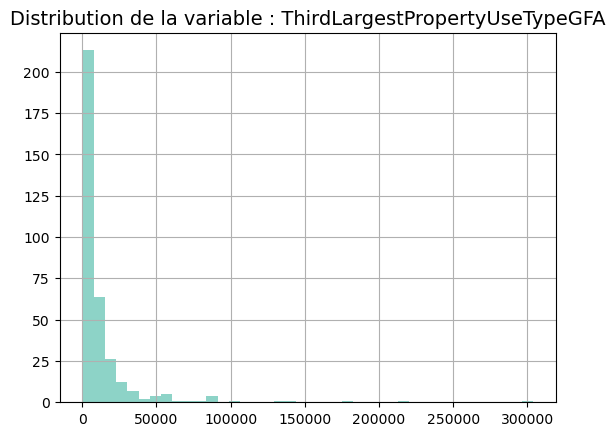

--------------------
ENERGYSTARScore
count    1089.000000
mean       65.490358
std        28.488551
min         1.000000
25%        48.000000
50%        73.000000
75%        89.000000
max       100.000000
Name: ENERGYSTARScore, dtype: float64
Nombre de valeurs manquantes de la variable ENERGYSTARScore : 555
moy:
 65.49035812672176
med:
 73.0
mod:
 0    100.0
Name: ENERGYSTARScore, dtype: float64
Q_99:
 100.0
var:
 810.8522945457595
ect:
 28.47546829370431
skw:
 -0.7760501166976446
kur:
 -0.5047315988544678


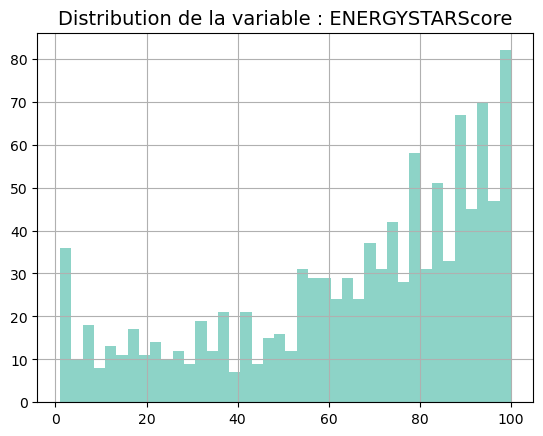

--------------------
SiteEUI(kBtu/sf)
count    1641.000000
mean       71.666910
std        74.075057
min         0.000000
25%        33.500000
50%        51.400002
75%        81.000000
max       834.400024
Name: SiteEUI(kBtu/sf), dtype: float64
Nombre de valeurs manquantes de la variable SiteEUI(kBtu/sf) : 3
moy:
 71.66691049313894
med:
 51.40000153
mod:
 0    0.0
Name: SiteEUI(kBtu/sf), dtype: float64
Q_99:
 351.86000975999957
var:
 5483.770278303503
ect:
 74.05248326898635
skw:
 3.7692422370563547
kur:
 22.551393780180117


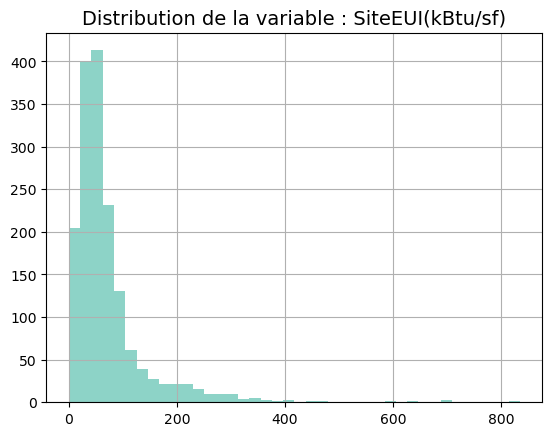

--------------------
SiteEUIWN(kBtu/sf)
count    1641.000000
mean       74.097684
std        75.020136
min         0.000000
25%        35.299999
50%        53.599998
75%        84.599998
max       834.400024
Name: SiteEUIWN(kBtu/sf), dtype: float64
Nombre de valeurs manquantes de la variable SiteEUIWN(kBtu/sf) : 3
moy:
 74.09768437320902
med:
 53.59999847
mod:
 0    0.0
Name: SiteEUIWN(kBtu/sf), dtype: float64
Q_99:
 363.0199951199999
var:
 5624.5911032545455
ect:
 74.99727397215545
skw:
 3.6736314359589026
kur:
 21.383471768913637


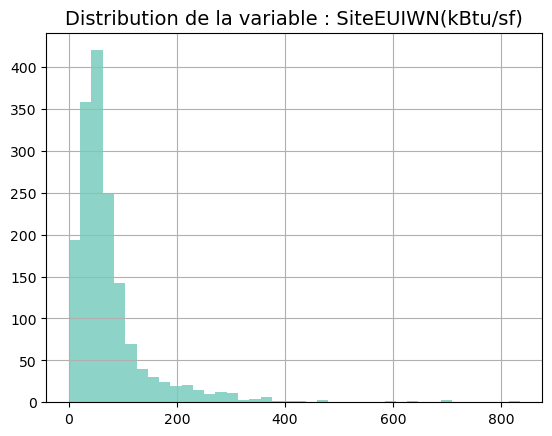

--------------------
SourceEUI(kBtu/sf)
count    1642.000000
mean      174.913764
std       186.461330
min         0.000000
25%        75.950001
50%       130.150002
75%       202.174999
max      2620.000000
Name: SourceEUI(kBtu/sf), dtype: float64
Nombre de valeurs manquantes de la variable SourceEUI(kBtu/sf) : 2
moy:
 174.91376371304935
med:
 130.1500015
mod:
 0    0.0
Name: SourceEUI(kBtu/sf), dtype: float64
Q_99:
 781.217982798
var:
 34746.6536975423
ect:
 186.40454312473798
skw:
 4.962902908181771
kur:
 43.88968551719163


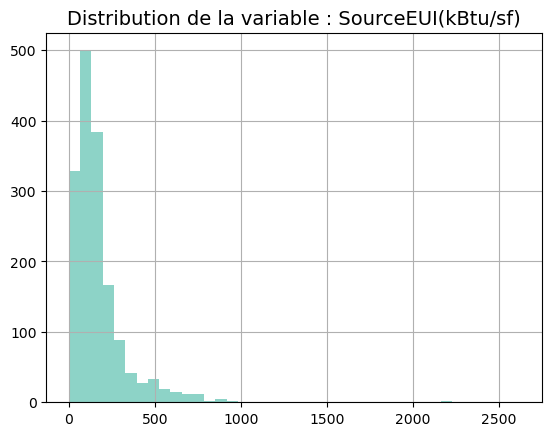

--------------------
SourceEUIWN(kBtu/sf)
count    1642.000000
mean      177.271011
std       186.393452
min        -2.100000
25%        78.925001
50%       133.300003
75%       204.225002
max      2620.000000
Name: SourceEUIWN(kBtu/sf), dtype: float64
Nombre de valeurs manquantes de la variable SourceEUIWN(kBtu/sf) : 2
moy:
 177.27101100997263
med:
 133.3000031
mod:
 0    0.0
Name: SourceEUIWN(kBtu/sf), dtype: float64
Q_99:
 790.646980601999
var:
 34721.36046541547
ect:
 186.3366857744751
skw:
 4.942718848528459
kur:
 43.70714022287739


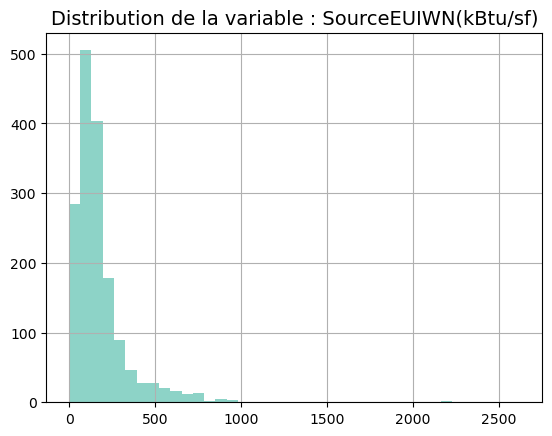

--------------------
SiteEnergyUse(kBtu)
count    1.642000e+03
mean     7.373224e+06
std      1.814333e+07
min      0.000000e+00
25%      1.215744e+06
50%      2.498541e+06
75%      6.785911e+06
max      2.930908e+08
Name: SiteEnergyUse(kBtu), dtype: float64
Nombre de valeurs manquantes de la variable SiteEnergyUse(kBtu) : 2
moy:
 7373224.059666381
med:
 2498541.375
mod:
 0    0.0
Name: SiteEnergyUse(kBtu), dtype: float64
Q_99:
 64550326.279999904
var:
 328979871076610.9
ect:
 18137802.266995054
skw:
 9.682706031251294
kur:
 129.28392826939563


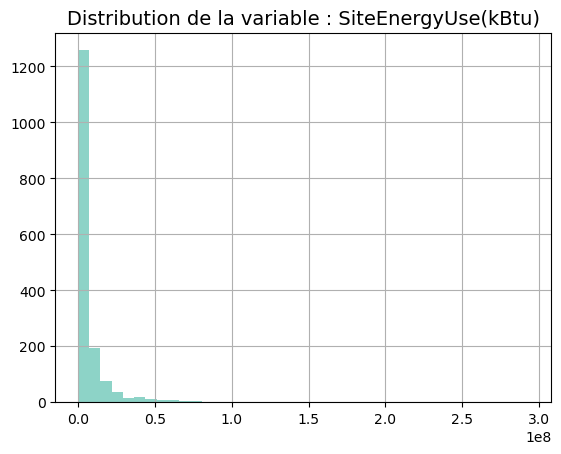

--------------------
SiteEnergyUseWN(kBtu)
count    1.641000e+03
mean     7.492230e+06
std      1.830007e+07
min      0.000000e+00
25%      1.280846e+06
50%      2.644410e+06
75%      7.034168e+06
max      2.966717e+08
Name: SiteEnergyUseWN(kBtu), dtype: float64
Nombre de valeurs manquantes de la variable SiteEnergyUseWN(kBtu) : 3
moy:
 7492229.7683778005
med:
 2644410.5
mod:
 0    0.0
Name: SiteEnergyUseWN(kBtu), dtype: float64
Q_99:
 62767811.199999906
var:
 334688585608852.0
ect:
 18294496.04686754
skw:
 9.748497156255596
kur:
 130.60842732007495


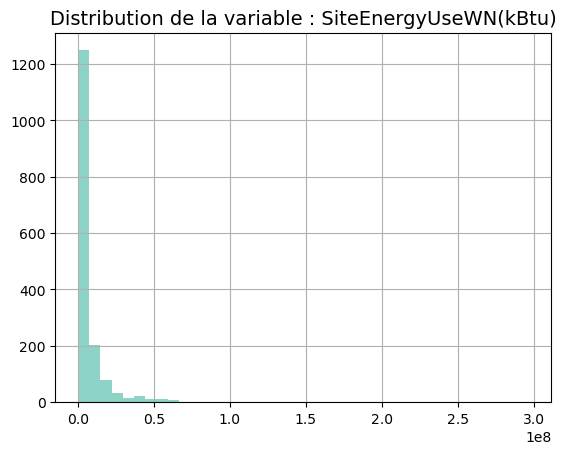

--------------------
SteamUse(kBtu)
count    1.642000e+03
mean     4.655966e+05
std      5.146583e+06
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.349435e+08
Name: SteamUse(kBtu), dtype: float64
Nombre de valeurs manquantes de la variable SteamUse(kBtu) : 2
moy:
 465596.5757200244
med:
 0.0
mod:
 0    0.0
Name: SteamUse(kBtu), dtype: float64
Q_99:
 8296346.619999933
var:
 26471184598217.832
ect:
 5145015.510007509
skw:
 21.21243448851187
kur:
 503.10471748143664


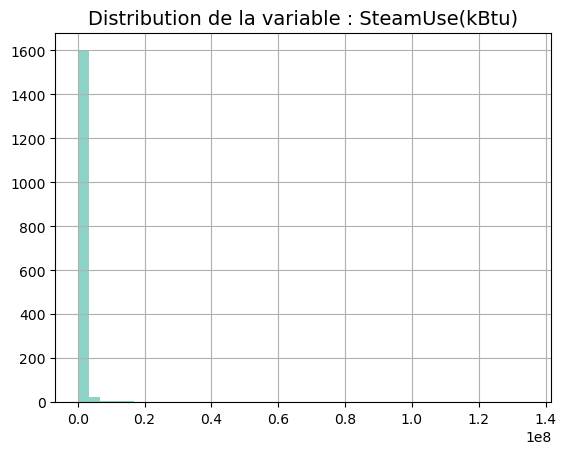

--------------------
Electricity(kWh)
count    1.642000e+03
mean     1.528241e+06
std      3.717491e+06
min     -3.382680e+04
25%      2.105215e+05
50%      4.672902e+05
75%      1.387276e+06
max      8.046087e+07
Name: Electricity(kWh), dtype: float64
Nombre de valeurs manquantes de la variable Electricity(kWh) : 2
moy:
 1528241.4167076661
med:
 467290.25
mod:
 0    0.0
Name: Electricity(kWh), dtype: float64
Q_99:
 14508966.429999998
var:
 13811324189586.043
ect:
 3716358.9963277285
skw:
 9.770218937029085
kur:
 155.9720782720328


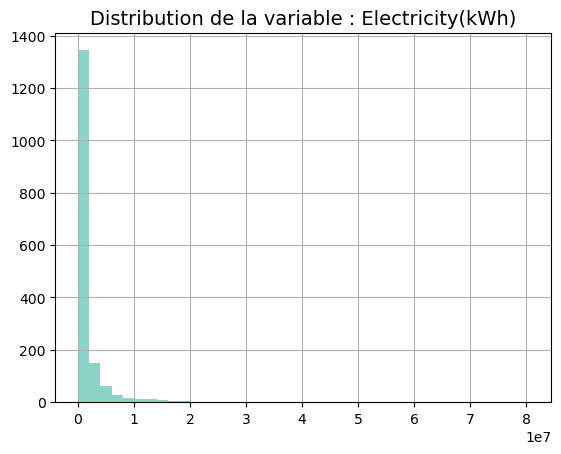

--------------------
Electricity(kBtu)
count    1.642000e+03
mean     5.214360e+06
std      1.268408e+07
min     -1.154170e+05
25%      7.182992e+05
50%      1.594394e+06
75%      4.733386e+06
max      2.745325e+08
Name: Electricity(kBtu), dtype: float64
Nombre de valeurs manquantes de la variable Electricity(kBtu) : 2
moy:
 5214359.715644336
med:
 1594394.5
mod:
 0    0.0
Name: Electricity(kBtu), dtype: float64
Q_99:
 49504593.29
var:
 160787900151109.72
ect:
 12680216.881075406
skw:
 9.770218933265957
kur:
 155.972078208992


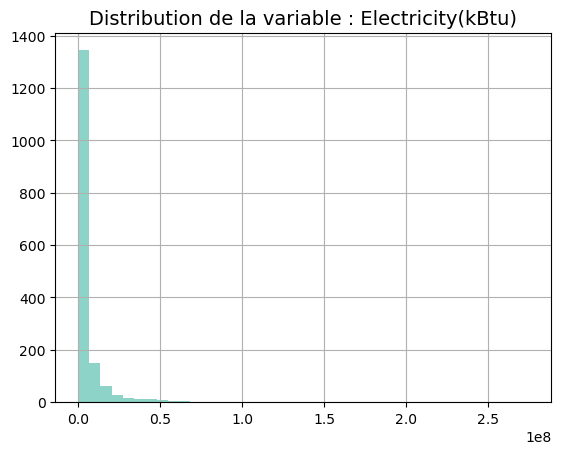

--------------------
NaturalGas(therms)
count    1.642000e+03
mean     1.660929e+04
std      5.352787e+04
min      0.000000e+00
25%      0.000000e+00
50%      4.835180e+03
75%      1.446404e+04
max      1.381912e+06
Name: NaturalGas(therms), dtype: float64
Nombre de valeurs manquantes de la variable NaturalGas(therms) : 2
moy:
 16609.28859399597
med:
 4835.18042
mod:
 0    0.0
Name: NaturalGas(therms), dtype: float64
Q_99:
 176886.7673629995
var:
 2863488304.2916126
ect:
 53511.57168586634
skw:
 14.605250941346155
kur:
 308.05257010827233


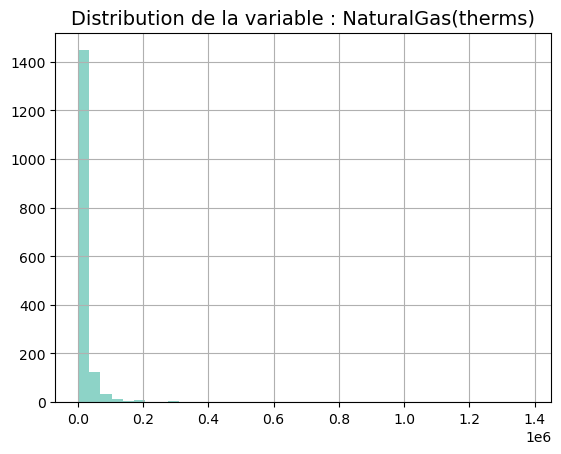

--------------------
NaturalGas(kBtu)
count    1.642000e+03
mean     1.660929e+06
std      5.352787e+06
min      0.000000e+00
25%      0.000000e+00
50%      4.835180e+05
75%      1.446404e+06
max      1.381912e+08
Name: NaturalGas(kBtu), dtype: float64
Nombre de valeurs manquantes de la variable NaturalGas(kBtu) : 2
moy:
 1660928.8636040194
med:
 483518.0
mod:
 0    0.0
Name: NaturalGas(kBtu), dtype: float64
Q_99:
 17688676.679999948
var:
 28634883109698.082
ect:
 5351157.174826589
skw:
 14.60525099837485
kur:
 308.0525726055128


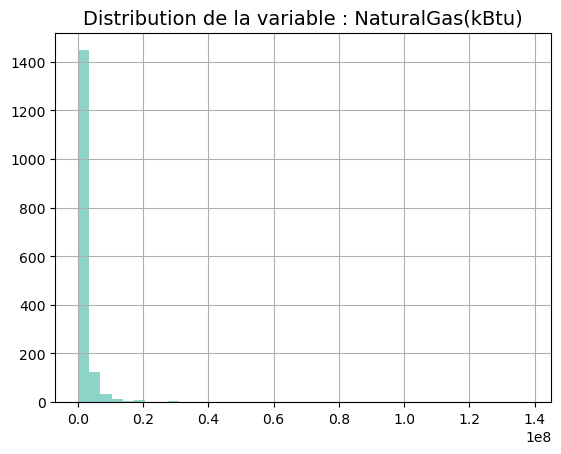

--------------------
Comments
count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: Comments, dtype: float64
Nombre de valeurs manquantes de la variable Comments : 1644
moy:
 nan
med:
 nan
mod:
 Series([], Name: Comments, dtype: float64)
Q_99:
 nan
var:
 nan
ect:
 nan
skw:
 nan
kur:
 nan


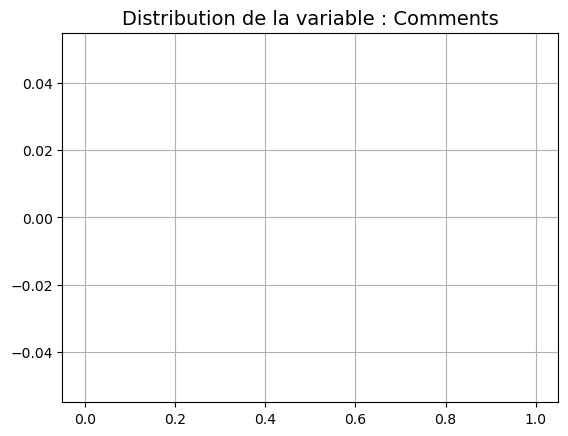

--------------------
TotalGHGEmissions
count     1642.000000
mean       160.501760
std        554.183554
min         -0.800000
25%         19.780000
50%         49.105000
75%        134.815000
max      12307.160000
Name: TotalGHGEmissions, dtype: float64
Nombre de valeurs manquantes de la variable TotalGHGEmissions : 2
moy:
 160.50176004872108
med:
 49.105000000000004
mod:
 0    0.0
Name: TotalGHGEmissions, dtype: float64
Q_99:
 1674.4440999999952
var:
 306932.3717631021
ect:
 554.0147757624359
skw:
 14.327750326514643
kur:
 260.7532787892357


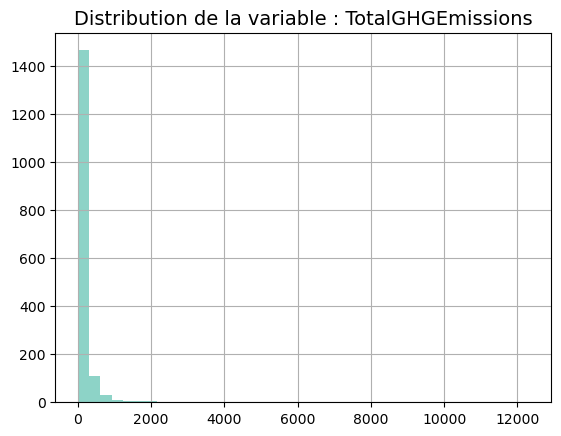

--------------------
GHGEmissionsIntensity
count    1642.000000
mean        1.570402
std         2.186648
min        -0.020000
25%         0.340000
50%         0.860000
75%         1.877500
max        25.710000
Name: GHGEmissionsIntensity, dtype: float64
Nombre de valeurs manquantes de la variable GHGEmissionsIntensity : 2
moy:
 1.5704019488428749
med:
 0.86
mod:
 0    0.23
1    0.28
Name: GHGEmissionsIntensity, dtype: float64
Q_99:
 10.994399999999988
var:
 4.778517256220312
ect:
 2.185981988997236
skw:
 3.8086214256543136
kur:
 21.614613152221118


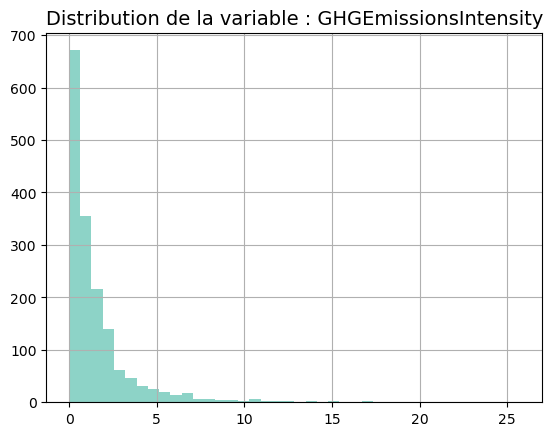

In [9]:
variables_int = building_energy.select_dtypes(include=['float64']).columns.tolist()

# Afficher un résumé et un histogramme pour chaque variable quantitative :
for variable in variables_int:
    print("-"*20)
    print(variable)
    print(building_energy[variable].describe())
    nombre_valeurs_manquantes = building_energy[variable].isnull().sum()
    print(f"Nombre de valeurs manquantes de la variable {variable} : {nombre_valeurs_manquantes}")
    print("moy:\n",building_energy[variable].mean())
    print("med:\n",building_energy[variable].median())
    print("mod:\n",building_energy[variable].mode())
    print("Q_99:\n",building_energy[variable].quantile(0.99))
    print("var:\n",building_energy[variable].var(ddof=0))
    print("ect:\n",building_energy[variable].std(ddof=0))
    print("skw:\n",building_energy[variable].skew())
    print("kur:\n",building_energy[variable].kurtosis())
    building_energy[variable].hist(bins=40)
    plt.title(f"Distribution de la variable : {variable}",fontsize=14)
    plt.show()

<b> 22 variables - 1644 batiments </b>

Variables à supprimer / modifier en categ : 
- NumberofBuildings : de 0 à 9 (1 batiment pour plus de 75% des données), 2 valeurs manquantes 
- Comments : vide 

Variables de localisation : 
- ZipCode : code postal à transformer en catégorielle ???? 16 valeurs manquantes
- latitude / longitude : pas de valeurs manquantes, pas de valeurs aberrantes

Variables de mesures d'énergie :
- LargestPropertyUseTypeGFA : le "LargestPropertyUseTypeGFA" représente la superficie totale de plancher attribuée au type d'utilisation principal dominant du bâtiment (surface brute de plancher = Gross Floor Area, GFA), 6 valeurs manquantes
    --> en m² ? pied carré ? étudier plus précisement les valeurs aberrantes
- SecondLargestPropertyUseTypeGFA, idem, une valeur abberrante ? 
- ThirdLargestPropertyUseTypeGFA, idem

- ENERGYSTARScore : score de 1 à 100, 540 valeurs manquantes

- SiteEUI(kBtu/sf) : 3 valeurs manquantes, "SiteEUI (kBtu/sf)" est un terme utilisé dans le domaine de l'efficacité énergétique des bâtiments pour désigner l'Energy Use Intensity (EUI) du site, mesurée en kilo-British thermal units par pied carré (kBtu/sf).
- SiteEUIWN : 3 valeurs manquantes, signifie "Site Energy Use Intensity Weather Normalized" (Intensité d'utilisation énergétique du site normalisée par la météo).
- SourceEUI(kBtu/sf) : Contrairement au "SiteEUI" qui ne prend en compte que l'énergie consommée directement sur place, le "SourceEUI" inclut également l'énergie nécessaire pour produire, acheminer et distribuer l'électricité, le gaz naturel, le fioul, etc., jusqu'au site du bâtiment. 2 valeurs manquantes.
- SourceEUIWN(kBtu/sf) : idem
- "SiteEnergyUse (kBtu)" : est une mesure utilisée pour quantifier la consommation d'énergie totale d'un bâtiment sur une période donnée, exprimée en kilo-British thermal units (kBtu). 2 valeurs manquantes
- SiteEnergyUseWN(kBtu) : signifie "Site Energy Use Weather Normalized" (Consommation d'énergie du site normalisée par la météo), exprimée en kilo-British thermal units (kBtu). 3 valeurs manquantes
- SteamUse (kBtu) : fait référence à la quantité d'énergie consommée sous forme de vapeur, mesurée en kilo-British thermal units (kBtu). Cette mesure indique la quantité d'énergie thermique utilisée pour produire de la vapeur dans un système de chauffage ou de production industrielle. 2 valeurs manquantes, mais quasi toutes les données = 0.
- Electricity(kWh) : fait référence à la quantité d'électricité consommée, mesurée en kilowatt-heures (kWh). 2 valeurs manquantes, attention valeurs aberrantes conso négative ???
- Electricity(kBtu)
- NaturalGas(therms) : 2 valeurs manquantes, quantité de gaz naturel consommée, mesurée en therms.
- NaturalGas(kBtu)
- TotalGHGEmissions : émissions totales de gaz à effet de serre (GES) d'une source spécifique, d'un bâtiment ou d'une activité, mesurées en unités d'émissions de gaz à effet de serre appropriées (généralement en tonnes métriques de dioxyde de carbone équivalent, tCO2e). 2 valeurs manquantes
- GHGEmissionsIntensity : exprime la quantité d'émissions de gaz à effet de serre produites pour chaque unité de l'indicateur choisi (unité de production, surface ou autre). Dans le contexte des bâtiments, l'intensité des émissions de GES pourrait être mesurée en tCO2e par pied carré (ou par mètre carré) de surface de plancher. 2 valeurs manquantes.

--------------------
OSEBuildingID
count     1644.000000
mean     16314.106448
std      13824.494495
min          1.000000
25%        584.750000
50%      21140.500000
75%      24602.250000
max      50226.000000
Name: OSEBuildingID, dtype: float64
Nombre de valeurs manquantes de la variable OSEBuildingID : 0
moy:
 16314.106447688564
med:
 21140.5
mod:
 0           1
1           2
2           3
3           5
4           8
        ...  
1639    50222
1640    50223
1641    50224
1642    50225
1643    50226
Name: OSEBuildingID, Length: 1644, dtype: int64
Q_99:
 50097.99
var:
 191000397.035506
ect:
 13820.289325318266
skw:
 0.32092769722325265
kur:
 -0.40440882629183283


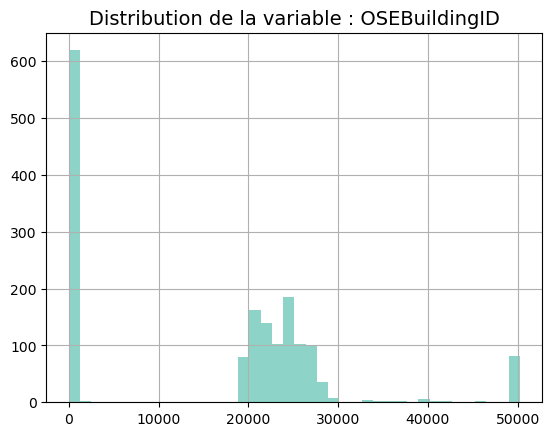

--------------------
DataYear
count    1644.0
mean     2016.0
std         0.0
min      2016.0
25%      2016.0
50%      2016.0
75%      2016.0
max      2016.0
Name: DataYear, dtype: float64
Nombre de valeurs manquantes de la variable DataYear : 0
moy:
 2016.0
med:
 2016.0
mod:
 0    2016
Name: DataYear, dtype: int64
Q_99:
 2016.0
var:
 0.0
ect:
 0.0
skw:
 0
kur:
 0


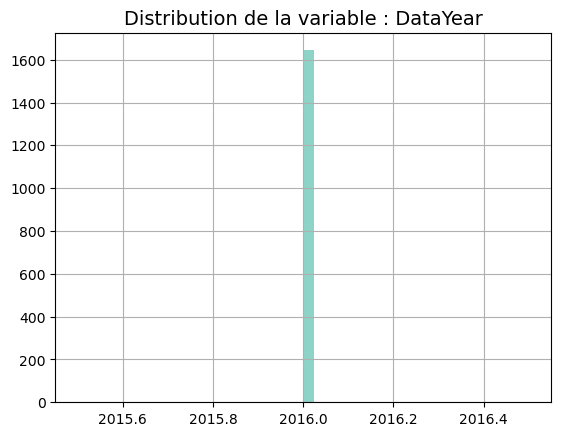

--------------------
CouncilDistrictCode
count    1644.000000
mean        4.361922
std         2.188563
min         1.000000
25%         2.000000
50%         4.000000
75%         7.000000
max         7.000000
Name: CouncilDistrictCode, dtype: float64
Nombre de valeurs manquantes de la variable CouncilDistrictCode : 0
moy:
 4.361922141119221
med:
 4.0
mod:
 0    7
Name: CouncilDistrictCode, dtype: int64
Q_99:
 7.0
var:
 4.786895575446494
ect:
 2.1878975239819836
skw:
 0.002816704090152776
kur:
 -1.5759241121232885


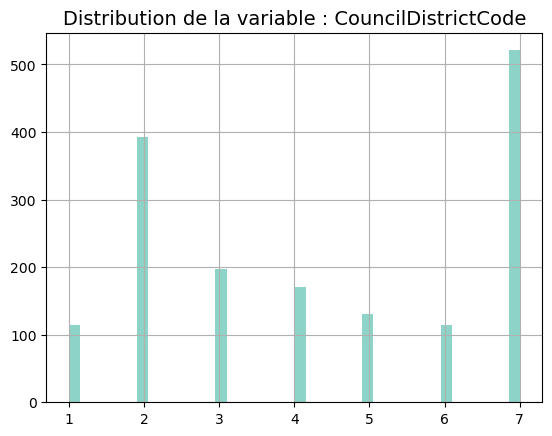

--------------------
YearBuilt
count    1644.000000
mean     1961.925791
std        32.695137
min      1900.000000
25%      1930.000000
50%      1965.000000
75%      1989.000000
max      2015.000000
Name: YearBuilt, dtype: float64
Nombre de valeurs manquantes de la variable YearBuilt : 0
moy:
 1961.9257907542578
med:
 1965.0
mod:
 0    1900
Name: YearBuilt, dtype: int64
Q_99:
 2014.0
var:
 1068.321743596119
ect:
 32.68519150312751
skw:
 -0.28962491787634287
kur:
 -1.0420610516234625


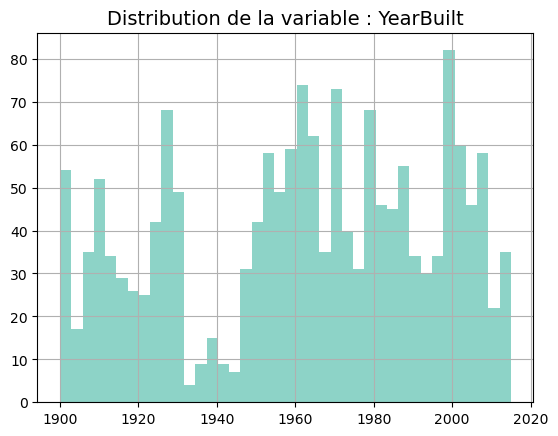

--------------------
NumberofFloors
count    1644.000000
mean        4.144769
std         6.603893
min         0.000000
25%         1.000000
50%         2.000000
75%         4.000000
max        99.000000
Name: NumberofFloors, dtype: float64
Nombre de valeurs manquantes de la variable NumberofFloors : 0
moy:
 4.144768856447689
med:
 2.0
mod:
 0    1
Name: NumberofFloors, dtype: int64
Q_99:
 36.569999999999936
var:
 43.58488139426212
ect:
 6.601884685017008
skw:
 6.009997733274757
kur:
 52.10424033119563


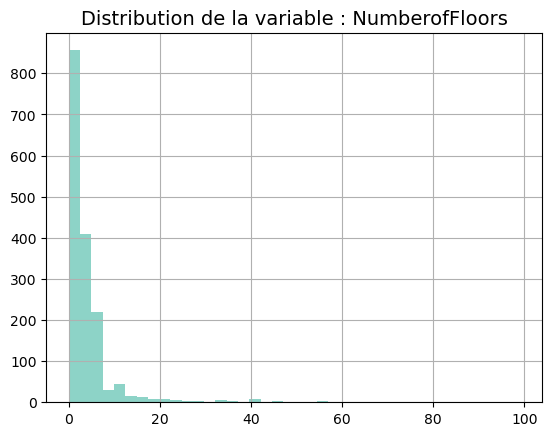

--------------------
PropertyGFATotal
count    1.644000e+03
mean     1.106277e+05
std      1.865990e+05
min      1.128500e+04
25%      2.939350e+04
50%      4.898850e+04
75%      1.030000e+05
max      1.952220e+06
Name: PropertyGFATotal, dtype: float64
Nombre de valeurs manquantes de la variable PropertyGFATotal : 0
moy:
 110627.73661800487
med:
 48988.5
mod:
 0    25920
1    28800
2    36000
Name: PropertyGFATotal, dtype: int64
Q_99:
 1065056.3099999987
var:
 34798015985.60637
ect:
 186542.26326922906
skw:
 4.835719982215711
kur:
 29.86839718992036


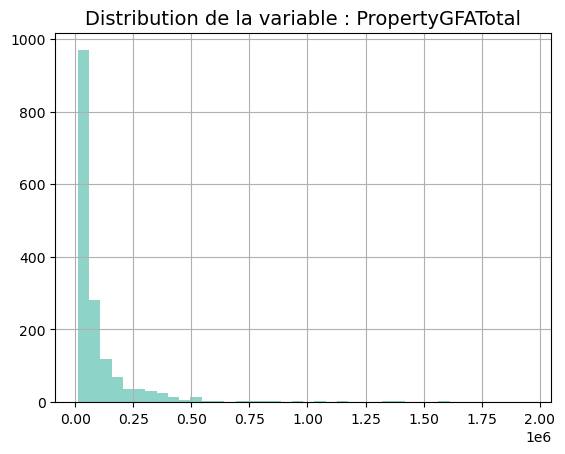

--------------------
PropertyGFAParking
count      1644.000000
mean      12998.984185
std       42483.530246
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max      512608.000000
Name: PropertyGFAParking, dtype: float64
Nombre de valeurs manquantes de la variable PropertyGFAParking : 0
moy:
 12998.984184914842
med:
 0.0
mod:
 0    0
Name: PropertyGFAParking, dtype: int64
Q_99:
 201540.51999999996
var:
 1803752501.331965
ect:
 42470.607498974685
skw:
 5.207359269768907
kur:
 35.23406603117988


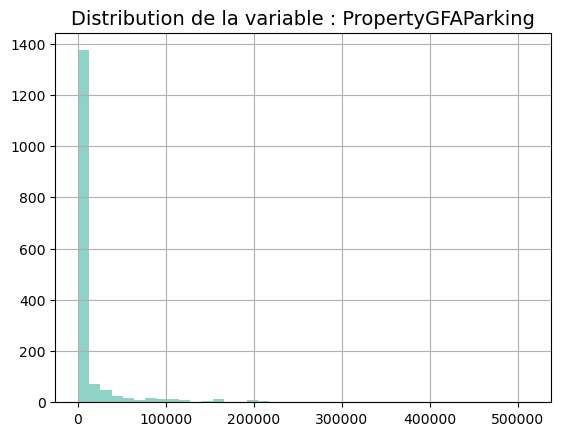

--------------------
PropertyGFABuilding(s)
count    1.644000e+03
mean     9.762875e+04
std      1.640849e+05
min      3.636000e+03
25%      2.835600e+04
50%      4.696400e+04
75%      9.356875e+04
max      1.765970e+06
Name: PropertyGFABuilding(s), dtype: float64
Nombre de valeurs manquantes de la variable PropertyGFABuilding(s) : 0
moy:
 97628.75243309002
med:
 46964.0
mod:
 0    25920
1    28800
2    36000
Name: PropertyGFABuilding(s), dtype: int64
Q_99:
 942098.1499999991
var:
 26907465343.44054
ect:
 164034.95159093547
skw:
 5.09037310623351
kur:
 32.9256276452613


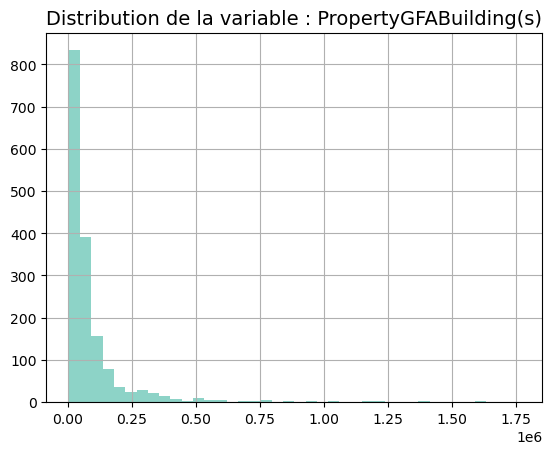

In [10]:
variables_int = building_energy.select_dtypes(include=['int64']).columns.tolist()

# Afficher un résumé et un histogramme pour chaque variable quantitative :
for variable in variables_int:
    print("-"*20)
    print(variable)
    print(building_energy[variable].describe())
    nombre_valeurs_manquantes = building_energy[variable].isnull().sum()
    print(f"Nombre de valeurs manquantes de la variable {variable} : {nombre_valeurs_manquantes}")
    print("moy:\n",building_energy[variable].mean())
    print("med:\n",building_energy[variable].median())
    print("mod:\n",building_energy[variable].mode())
    print("Q_99:\n",building_energy[variable].quantile(0.99))
    print("var:\n",building_energy[variable].var(ddof=0))
    print("ect:\n",building_energy[variable].std(ddof=0))
    print("skw:\n",building_energy[variable].skew())
    print("kur:\n",building_energy[variable].kurtosis())
    building_energy[variable].hist(bins=40)
    plt.title(f"Distribution de la variable : {variable}",fontsize=14)
    plt.show()

<b> 8 variables INT - 1644 batiments </b>

Variables à supprimer : 
- DataYear : tout est à 2016

Variables à conserver : 
- PropertyGFATotal : surface brute totale (Gross Floor Area, GFA) d'une propriété, 0 valeurs manquantes.
- PropertyGFAParking : surface brute totale (Gross Floor Area, GFA) réservée aux espaces de stationnement dans une propriété ou un bâtiment.
- PropertyGFABuilding(s) : surface brute totale (Gross Floor Area, GFA) consacrée aux bâtiments eux-mêmes.
- NumberofFloors : nombre d'étages de 0 à 99, 0 valeurs manquantes

Variables à transformer en txt, categ ou année :
- OSEBuildingID : identifiant attribué à un bâtiment spécifique dans le cadre d'un système de suivi ou de gestion des bâtiments. 0 valeurs manquantes
- CouncilDistrictCode : numéro de disctrict de 1 à 7, 0 valeurs manquantes, à transformer en catég ?
- YearBuilt : année de construction de 1900 à 2015, 0 valeurs manquantes



<div class="alert alert-block alert-info">
    <b> ---> RESUME DES VARIABLES DU FICHIER : </b>

Identifiants :
- OSEBuildingID

Localité :
- ZipCode
- CouncilDistrictCode --> à voir si redondant avec code postal
- Adress
- Neighborhood : 19 modalités localités (east, ballard, etc.) --> à voir, lien avec les 2 autres ?
- latitude / longitude
	
Batiment :
- PropertyName
- YearBuilt --> à catégoriser ? // changer en age du batiment pour ne pas avoir des valeurs trop élevées
- NumberofFloors
- NumberofBuildings

Utilisation du batiment : 
- PrimaryPropertyType --> voir à quel point c'est corrélé à LargestPropertyUseType ?
- LargestPropertyUseType --> supprimer et garder le global ? 
- SecondLargestPropertyUseType --> supprimer et garder le global ? 
- ThirdLargestPropertyUseType --> supprimer et garder le global ? 

Surface du batiment : 
- PropertyGFATotal
- PropertyGFAParking
- PropertyGFABuilding(s)
- LargestPropertyUseTypeGFA --> supprimer et garder le global ? 
- SecondLargestPropertyUseTypeGFA --> supprimer et garder le global ? 
- ThirdLargestPropertyUseTypeGFA --> supprimer et garder le global ? 

Donnes de mesures d'energie :
- SiteEUI(kBtu/sf) = énergie totale consommée par un bâtiment pour chaque pied carré de surface
- SiteEUIWN (kBtu/sf)
	
- SourceEUI(kBtu/sf) = Contrairement au "SiteEUI" qui ne prend en compte que l'énergie consommée directement sur place, le "SourceEUI" inclut également l'énergie nécessaire pour produire, acheminer et distribuer l'électricité, le gaz naturel, le fioul, etc., jusqu'au site du bâtiment.
- SourceEUIWN(kBtu/sf)
	
- SiteEnergyUse (kBtu) = consommation d'énergie totale d'un bâtiment sur une période donnée, exprimée en kilo-British thermal units (kBtu)
- SiteEnergyUseWN(kBtu)
	
- SteamUse (kBtu) = quantité d'énergie consommée sous forme de vapeur
- Electricity(kBtu) = quantité d'électricité consommée
- NaturalGas(kBtu) = quantité de gaz naturel consommée
	
- TotalGHGEmissions = émissions totales de gaz à effet de serre (GES) d'une source spécifique, d'un bâtiment ou d'une activité, mesurées en unités d'émissions de gaz à effet de serre appropriées (généralement en tonnes métriques de dioxyde de carbone équivalent, tCO2e).
- GHGEmissionsIntensity = intensité des émissions de gaz à effet de serre (GES), mesurée par unité de surface 
   
Score :
- ENERGYSTARScore
</div>

### 3. Analyse descriptives des variables (identifier les valeurs aberrantes, zéros, incohérences)

##### -- CouncilDistrictCode x ZipCode x Neighborhood --

In [11]:
building_energy['CouncilDistrictCode'].describe()

count    1644.000000
mean        4.361922
std         2.188563
min         1.000000
25%         2.000000
50%         4.000000
75%         7.000000
max         7.000000
Name: CouncilDistrictCode, dtype: float64

In [12]:
X = "CouncilDistrictCode"
Y = "Neighborhood"

cont = building_energy[[X,Y]].pivot_table(index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total")
cont

Neighborhood,BALLARD,Ballard,CENTRAL,Central,DELRIDGE,DELRIDGE NEIGHBORHOODS,DOWNTOWN,Delridge,EAST,GREATER DUWAMISH,LAKE UNION,MAGNOLIA / QUEEN ANNE,NORTH,NORTHEAST,NORTHWEST,North,Northwest,SOUTHEAST,SOUTHWEST,Total
CouncilDistrictCode,,,,,,,,,,,,,,,,,,,,
1,NaN,NaN,NaN,NaN,40.0,1.0,NaN,4.0,NaN,29.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.0,115
2,NaN,NaN,NaN,NaN,NaN,NaN,43.0,NaN,1.0,307.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.0,NaN,393
3,NaN,NaN,49.0,5.0,NaN,NaN,10.0,NaN,111.0,4.0,14.0,NaN,NaN,1.0,NaN,NaN,NaN,4.0,NaN,198
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.0,NaN,2.0,121.0,NaN,NaN,NaN,NaN,NaN,171
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56.0,4.0,62.0,9.0,NaN,NaN,NaN,131
6,64.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.0,NaN,NaN,NaN,18.0,NaN,5.0,NaN,NaN,115
7,NaN,NaN,NaN,NaN,NaN,NaN,302.0,NaN,7.0,NaN,63.0,149.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,521
Total,64.0,6.0,49.0,5.0,40.0,1.0,355.0,4.0,119.0,340.0,147.0,149.0,58.0,126.0,80.0,9.0,5.0,46.0,41.0,1644


In [13]:
X = "ZipCode"
Y = "Neighborhood"

cont = building_energy[[X,Y]].pivot_table(index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total")
cont

Neighborhood,BALLARD,Ballard,CENTRAL,Central,DELRIDGE,DOWNTOWN,Delridge,EAST,GREATER DUWAMISH,LAKE UNION,MAGNOLIA / QUEEN ANNE,NORTH,NORTHEAST,NORTHWEST,North,Northwest,SOUTHEAST,SOUTHWEST,Total
ZipCode,,,,,,,,,,,,,,,,,,,
98006.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
98011.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
98013.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,2
98020.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
98033.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
98053.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1
98070.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
98101.0,NaN,NaN,NaN,NaN,1.0,128.0,NaN,14.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,144
98102.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN,18.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,26


<div class="alert alert-block alert-info">
    <b> BILAN : </b> pour le moment, conservation du ZipCode car plus précis --> si on l'utilise dans le modèle, il faudra remplacer les valeurs manquantes (16) et modifier la nature de la variable en catégorielle, les valeurs numériques n'ont pas de sens.
Cette information est aussi redondante avec les longitudes - latitudes.
</div>

##### -- Longitude x Latitude --

Installation de la Librairie folium pour représentation avec longitude, latitude : 
https://python-visualization.github.io/folium/latest/getting_started.html

In [14]:
# Coordonnées initiales de la carte (moyenne des coordonnées)
mean_longitude = building_energy['Longitude'].mean()
mean_latitude = building_energy['Latitude'].mean()

In [15]:
# Création de la carte
m = folium.Map(location=[mean_latitude, mean_longitude], zoom_start=10)

colormap = linear.YlGnBu_09.scale(building_energy['SiteEUI(kBtu/sf)'].min(), building_energy['SiteEUI(kBtu/sf)'].max())
colormap

In [16]:
# Représentation de chaque bâtiment par un point sur la carte avec clic pour type de bâtiment et couleur en fonction de leur énergie consomée / surface
# Définir les seuils et les couleurs correspondantes
thresholds = [0, 100, 200, 300, 400, 500, 800]  
colors = ['green', 'yellow', 'orange', 'red', 'darkred','black']

# Définir une fonction pour attribuer une couleur en fonction de la valeur de SiteEUI(kBtu/sf)
def assign_color(value):
    for i in range(len(thresholds) - 1):
        if value >= thresholds[i] and value < thresholds[i + 1]:
            return colors[i]
    return colors[-1]  # Si la valeur est supérieure au dernier seuil, utilisez la dernière couleur

# Paramètres du marqueur
radius = 5

# Ajout des marqueurs pour chaque point dans le DataFrame
for i in building_energy.index:
    folium.CircleMarker(
        location=[building_energy.loc[i, 'Latitude'], building_energy.loc[i, 'Longitude']],  # L'ordre est (latitude, longitude)
        radius=radius,
        color=assign_color(building_energy.loc[i, 'SiteEUI(kBtu/sf)']),  # Utilisation de la fonction assign_color
        # color=colormap(building_energy.loc[i, 'SiteEUI(kBtu/sf)']),  # Ne fonctionne pas
        stroke=False,
        fill=True,
        fill_opacity=0.6,
        opacity=1,
        popup=str(building_energy.loc[i, 'PrimaryPropertyType']),  # Conversion en chaîne de caractères nécessaire
        tooltip="Clic pour type de bâtiment",
    ).add_to(m)

# Affichage de la carte
m


In [17]:
# Représentation de chaque bâtiment par un point sur la carte avec couleur pour type de bâtiment et taille en fonction de leur énergie consomée
# Clic pour type de bâtiment

unique_types = building_energy['PrimaryPropertyType'].unique()
# Utiliser une palette de couleurs de Seaborn pour obtenir un ensemble de couleurs
palette = sns.color_palette("hsv", len(unique_types))  # hsv est un modèle de couleurs qui fournit un large éventail de couleurs

# Créer un mapping des couleurs pour chaque modalité de PrimaryPropertyType
color_mapping = dict(zip(unique_types, palette))

# Normaliser les valeurs de 'SiteEnergyUse (kBtu)'
max_eui = building_energy['SiteEnergyUse(kBtu)'].max()
min_eui = building_energy['SiteEnergyUse(kBtu)'].min()
building_energy['Normalized_EUI'] = (building_energy['SiteEnergyUse(kBtu)'] - min_eui) / (max_eui - min_eui)

# Ajout des marqueurs pour chaque point dans le DataFrame
for i in building_energy.index:
    folium.CircleMarker(
        location=[building_energy.loc[i, 'Latitude'], building_energy.loc[i, 'Longitude']],  # L'ordre est (latitude, longitude)
        radius=building_energy.loc[i, 'Normalized_EUI'] * 100,
        color='#%02x%02x%02x' % tuple(int(255 * x) for x in color_mapping.get(building_energy.loc[i, 'PrimaryPropertyType'], (0, 0, 0))),  # Convertir les valeurs RGB en hexadécimal
        # color=colormap(building_energy.loc[i, 'SiteEUI(kBtu/sf)']),  # Ne fonctionne pas
        stroke=False,
        fill=True,
        fill_opacity=0.6,
        opacity=1,
        popup=str(building_energy.loc[i, 'PrimaryPropertyType']),  # Conversion en chaîne de caractères nécessaire
        tooltip="Clic pour type de bâtiment",
    ).add_to(m)

# Créer une légende hors de la carte pour expliquer chaque type de bâtiment et sa couleur
legend_html = '<div style="position: fixed; bottom: 5px; left: 50px; border: 2px solid black; background-color: white; z-index: 1000; padding: 10px; font-size: 10px;">'
for ptype, color in color_mapping.items():
    legend_html += f'<p><i style="background:{mcolors.to_hex(color)}">&nbsp;&nbsp;</i>&nbsp;{ptype}</p>'
legend_html += '</div>'
m.get_root().html.add_child(folium.Element(legend_html))

# Affichage de la carte
m


In [18]:
# Représentation de chaque bâtiment par un point sur la carte avec clic pour type de bâtiment
# Création de la carte
m_quartiers = folium.Map(location=[mean_latitude, mean_longitude], zoom_start=10)

# Ajout des marqueurs pour chaque quartier dans la ville
modalites = building_energy['Neighborhood'].unique()
for m in modalites:
    subset_m = building_energy[building_energy['Neighborhood'] == m] # On prend l'ensemble des bâtiments de la modalité m
    folium.CircleMarker(
        location=[subset_m['Latitude'].mean(), subset_m['Longitude'].mean()],  # L'ordre est (latitude, longitude)
        radius=(subset_m.shape[0]/10),
        color="cornflowerblue",
        stroke=False,
        fill=True,
        fill_opacity=0.5,
        opacity=1,
        popup = "Nombre de bâtiments dans le quartier " + m + " : " + str(subset_m.shape[0]),  # Conversion en chaîne de caractères nécessaire
        tooltip="Clic pour quartier",
    ).add_to(m_quartiers)

# Affichage de la carte
m_quartiers

##### -- YearBuilt --

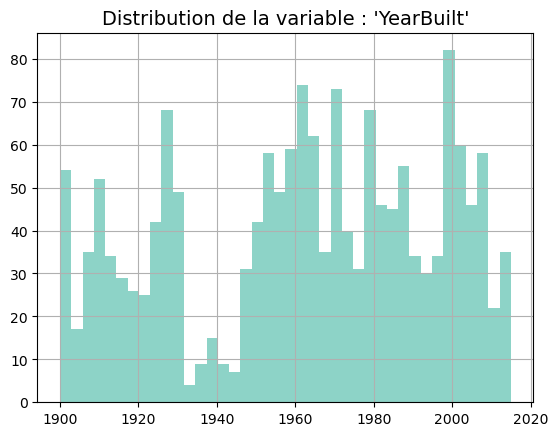

In [19]:
building_energy['YearBuilt'].hist(bins=40)
plt.title("Distribution de la variable : 'YearBuilt'",fontsize=14)
plt.show()

<div class="alert alert-block alert-info">
    <b> BILAN : </b> Envisager la modification de cette variable en age du batiment pour diminuer son amplitude.
</div>

##### -- NumberofBuildings, NumberofFloors --

In [20]:
# Aperçu de la variable :
effectifs = building_energy['NumberofBuildings'].value_counts()
modalites = effectifs.index # l'index de effectifs contient les modalités
tab = pd.DataFrame(modalites, columns = ['NumberofBuildings']) # Création du tableau à partir des modalités
tab["n"] = effectifs.values
tab

,NumberofBuildings,n
0,1.0,1551
1,0.0,52
2,2.0,14
3,3.0,10
4,5.0,5
5,6.0,4
6,4.0,2
7,8.0,2
8,9.0,1
9,7.0,1


In [21]:
# Aperçu de la variable :
effectifs = building_energy['NumberofFloors'].value_counts()
modalites = effectifs.index # l'index de effectifs contient les modalités
tab = pd.DataFrame(modalites, columns = ['NumberofFloors']) # Création du tableau à partir des modalités
tab["n"] = effectifs.values
tab

,NumberofFloors,n
0,1,461
1,2,381
2,3,267
3,4,143
4,5,101
5,6,84
6,7,34
7,8,22
8,11,18
9,10,17


##### -- Etude détaillée des variables suivantes : --
- 'YearsENERGYSTARCertified' : 64 modalités uniques, liste d'année, 1546 valeurs manquantes
- 'DefaultData' : valeurs False/True, majorité à False, 0 valeurs manquantes
- 'ComplianceStatus' : 4 modalités, compliante (1524), non compliante, error, missing, 0 valeurs manquantes
- 'Outlier' : 2 modalités low outlier (15), high outlier (2), 1627 valeurs manquantes

In [22]:
X = "DefaultData"
Y = "ComplianceStatus"

cont = building_energy[[X,Y]].pivot_table(index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total")
cont

ComplianceStatus,Compliant,Error - Correct Default Data,Missing Data,Non-Compliant,Total
DefaultData,,,,,
False,1524.0,NaN,14.0,18.0,1556
True,NaN,88.0,NaN,NaN,88
Total,1524.0,88.0,14.0,18.0,1644


In [23]:
X = "ComplianceStatus"
Y = "Outlier"

cont = building_energy[[X,Y]].pivot_table(index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total")
cont

Outlier,High outlier,Low outlier,Total
ComplianceStatus,,,
Error - Correct Default Data,NaN,2.0,2
Non-Compliant,2.0,13.0,15
Total,2.0,15.0,17


<div class="alert alert-block alert-info">
    <b> BILAN : </b> 
    
- 'YearsENERGYSTARCertified' : à supprimer
- 'DefaultData' : à supprimer, redondante avec 'ComplianceStatus'
- 'ComplianceStatus' : 4 modalités, compliante (1524), error (88), non compliante (18), missing (14), 0 valeurs manquantes
- 'Outlier' : 2 modalités low outlier (15), high outlier (2), tous les outliers sont en error ou non compliante
    
    <b> --> Filtrer le dataset sur 'ComplianceStatus' = compliante </b> 
    
</div>

#### -- Etude des variables de surface : PropertyGFATotal - PropertyGFAParking - PropertyGFABuilding(s) --


In [24]:
# La somme de PropertyGFAParking + PropertyGFABuilding(s) correspond à PropertyGFATotal ? OUI à 100%
# building_energy['verif'] = building_energy['PropertyGFAParking'] + building_energy['PropertyGFABuilding(s)']
# building_energy['delta_verif'] = building_energy['PropertyGFATotal'] - building_energy['verif']
# building_energy['delta_verif'].describe()

In [25]:
# Convertir les variables en m² pour une meilleure lisibilité
building_energy['PropertyGFAParking_m2'] = building_energy['PropertyGFAParking'] * 0.09290304
building_energy['PropertyGFABuilding(s)_m2'] = building_energy['PropertyGFABuilding(s)'] * 0.09290304
building_energy['PropertyGFATotal_m2'] = building_energy['PropertyGFAParking_m2'] + building_energy['PropertyGFABuilding(s)_m2']

building_energy['LargestPropertyUseTypeGFA_m2'] = building_energy['LargestPropertyUseTypeGFA'] * 0.09290304
building_energy['SecondLargestPropertyUseTypeGFA_m2'] = building_energy['SecondLargestPropertyUseTypeGFA'] * 0.09290304
building_energy['ThirdLargestPropertyUseTypeGFA_m2'] = building_energy['ThirdLargestPropertyUseTypeGFA'] * 0.09290304

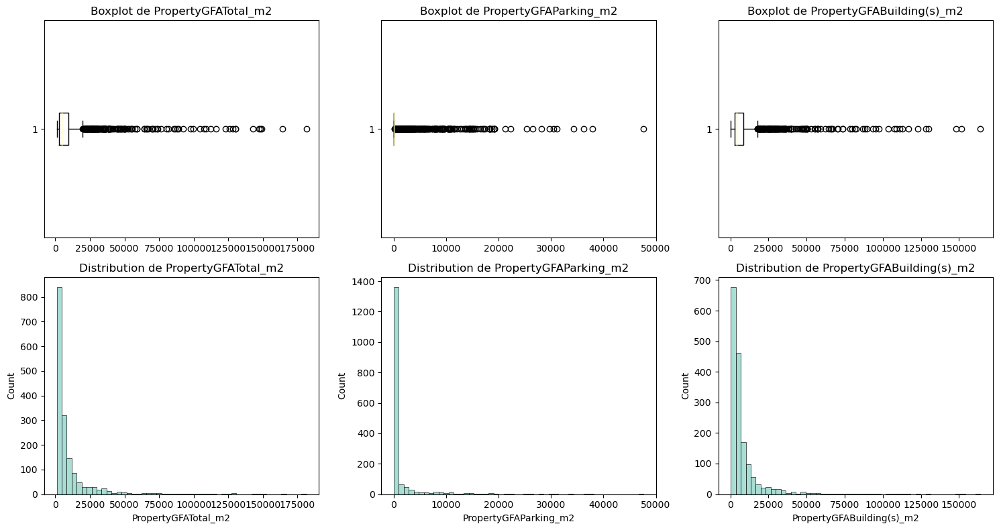

In [26]:
# Créer une figure et des sous-graphiques
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))

variables = ['PropertyGFATotal_m2', 'PropertyGFAParking_m2', 'PropertyGFABuilding(s)_m2']

for i, variable in enumerate(variables):
    axs[0, i].boxplot(building_energy[variable],vert=False)
    axs[0, i].set_title(f'Boxplot de {variable}')

    sns.histplot(data=building_energy, x=variable, bins=50, ax=axs[1, i])
    axs[1, i].set_title(f'Distribution de {variable}')

# Ajuster l'espacement entre les sous-graphiques
plt.tight_layout()

# Afficher la figure
plt.show()

In [27]:
base_triee = building_energy.sort_values(by='PropertyGFATotal_m2', ascending=False)
base_triee.head(10)

,OSEBuildingID,DataYear,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,...,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,Normalized_EUI,PropertyGFAParking_m2,PropertyGFABuilding(s)_m2,PropertyGFATotal_m2,LargestPropertyUseTypeGFA_m2,SecondLargestPropertyUseTypeGFA_m2,ThirdLargestPropertyUseTypeGFA_m2
559,775,2016,Large Office,Columbia Center - 2015,701 5th Avenue,Seattle,WA,98104.0,0942000640,7,...,NaN,882.56,0.45,0.317095,29673.230976,151693.941773,181367.172749,156164.157348,29670.258079,NaN
618,828,2016,Hospital,Swedish First Hill,747 Broadway,Seattle,WA,98122.0,1978201096,3,...,NaN,12307.16,6.97,0.994963,0.000000,164063.981549,164063.981549,152299.112175,41021.430215,NaN
292,422,2016,Large Office,Two Union Square,601 Union St.,Seattle,WA,98101.0,1976700125,7,...,NaN,525.78,0.33,0.168950,36219.179174,112943.897983,149163.077157,122118.723504,36219.179174,2856.211062
490,659,2016,Large Office,Russell Investments Center,1301 2nd Ave,Seattle,WA,98101.0,9184500000,7,...,NaN,481.06,0.30,0.192769,0.000000,147986.553059,147986.553059,84990.673889,32403.465516,28234.162886
155,245,2016,Other,CenturyLink,800 Occidental Ave. South,Seattle,WA,98134.0,7666204876,2,...,NaN,892.63,0.56,0.203887,30442.468147,116898.037171,147340.505318,147340.505318,0.000000,NaN
273,402,2016,Large Office,US Bank Centre,1420 5th Avenue,Seattle,WA,98101.0,1975700080,7,...,NaN,530.18,0.35,0.193135,47622.841528,95132.527154,142755.368682,93126.286005,35028.719620,4934.637873
304,435,2016,Other,Washington State Convention Center,705 Pike St,Seattle,WA,98101.0,1978200105,7,...,NaN,0.00,0.00,0.000000,0.000000,130064.256000,130064.256000,99592.058880,63801.162720,NaN
271,399,2016,Large Office,1201 Third Avenue,1201 3rd ave,Seattle,WA,98101.0,1974700120,7,...,NaN,588.90,0.42,0.181101,26477.366400,103586.889600,130064.256000,92356.398513,24571.088922,12411.660338
477,640,2016,Large Office,Starbucks Center,2401 Utah Ave South,Seattle,WA,98134.0,7666207220,2,...,NaN,810.70,0.59,0.252927,0.000000,128295.289215,128295.289215,92970.859219,26133.253540,20466.818421
233,357,2016,Large Office,Seattle Municipal Tower (2030),700 Fifth Avenue,Seattle,WA,98104.0,0942000720,3,...,NaN,429.27,0.32,0.210093,14827.325184,111055.086276,125882.411460,110658.204490,14827.232281,1733.199114


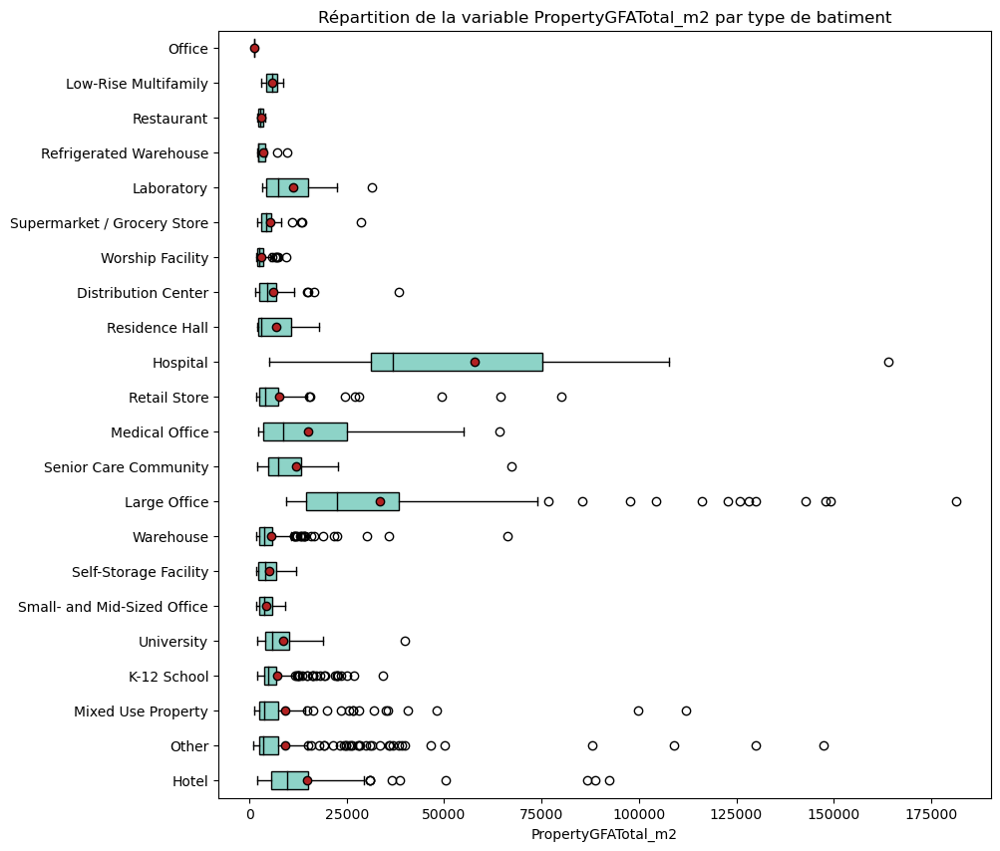

In [28]:
# Répartition de la variable 'PropertyGFATotal' par type de batiment :
y = 'PrimaryPropertyType' # qualitative
x = 'PropertyGFATotal_m2' # quantitative

modalites = building_energy[y].unique()
groupes = []
for m in modalites:
    groupes.append(building_energy[building_energy[y]==m][x])

# Propriétés graphiques 
plt.figure(figsize=(10, 10))
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
plt.title(f"Répartition de la variable {x} par type de batiment")
plt.xlabel(f'{x}')
plt.boxplot(groupes, labels=modalites, showfliers=True, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)

plt.show()

In [29]:
# Calcul à la main de eta carré :
x = 'PrimaryPropertyType' # qualitative
y = 'PropertyGFATotal_m2' # quantitative

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT
    
eta_squared(building_energy[x],building_energy[y])
# Sans surprise une corrélation forte entre le type de bâtiment et la surface

0.2877607447701721

<div class="alert alert-block alert-info">
    <b> BILAN : </b> 
    
- les outliers des variables de surface ne semblent pas être des erreurs : les hôpitaux et large office sont des surfaces souvent grandes.
- le type de bâtiment va sans doute jouer un rôle important dans la modélisation
    
</div>

#### -- Etude des variables d'usage du bâtiment et surfaces --

LargestPropertyUseTypeGFA - SecondLargestPropertyUseTypeGFA - ThirdLargestPropertyUseTypeGFA

In [30]:
# La somme de LargestPropertyUseTypeGFA + SecondLargestPropertyUseTypeGFA + ThirdLargestPropertyUseTypeGFA correspond à PropertyGFATotal ? Non pas exactement
building_energy['verifGFA'] = (building_energy['LargestPropertyUseTypeGFA'].fillna(0) +
                                 building_energy['SecondLargestPropertyUseTypeGFA'].fillna(0) +
                                 building_energy['ThirdLargestPropertyUseTypeGFA'].fillna(0))
building_energy['delta_verifGFA'] = building_energy['PropertyGFATotal'] - building_energy['verifGFA']
building_energy['delta_verifGFA'].describe()

count      1644.000000
mean       -731.345922
std       45465.326745
min     -635669.000000
25%           0.000000
50%           0.000000
75%        1196.250000
max      529052.000000
Name: delta_verifGFA, dtype: float64

<Axes: xlabel='delta_verifGFA', ylabel='Count'>

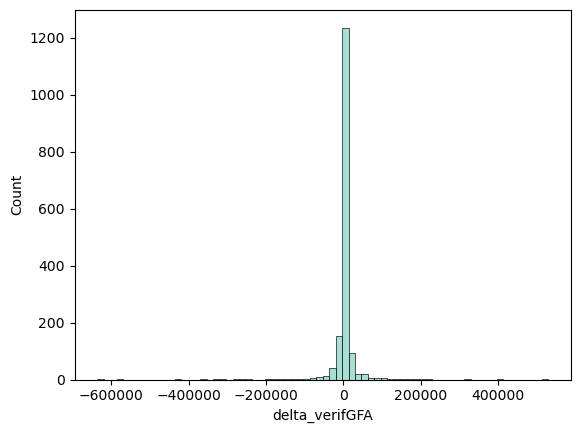

In [31]:
sns.histplot(data=building_energy, x='delta_verifGFA', bins=70)

In [32]:
max_values = building_energy['delta_verifGFA'].nlargest(10)
print(max_values) # entre 100 000 et 500 000 sf = 9 000 m² à 45 000 m² pour les 20 max

2530    529052.0
2835    400149.0
2314    318581.0
492     225095.0
564     206303.0
2       199617.0
356     187878.0
297     181607.0
404     165145.0
3267    154359.0
Name: delta_verifGFA, dtype: float64


In [33]:
# Obtenir les indices des 10 lignes ayant les valeurs les plus élevées dans la colonne 'delta_verifGFA'
indices_top_10 = building_energy['delta_verifGFA'].nlargest(10).index

# Sélectionner les lignes correspondantes dans le DataFrame
top_10_rows = building_energy.loc[indices_top_10]
# top_10_rows.head(10)

# Certains buldings mixed use property notamment peuvent avoir plus de 3 usages, dans ce cas ça parait possible
# En revanche quand il n'y a qu'un usage spécifié et que la surface totale est beaucoup plus importante, je ne vois pas de logique, sauf à ce que le parking ne soit pas spécifié dans les usages secondaires.
# Quand la surface totale est moins importante que la somme des surfaces ???? Parking ?

In [34]:
min_values = building_energy['delta_verifGFA'].nsmallest(10)
print(min_values) # entre -140 000 et -640 000 sf pour les 20 min

3264   -635669.0
170    -579142.0
3124   -432903.0
72     -364374.0
304    -358750.0
1672   -334721.0
602    -322252.0
618    -314915.0
488    -276652.0
1690   -264757.0
Name: delta_verifGFA, dtype: float64


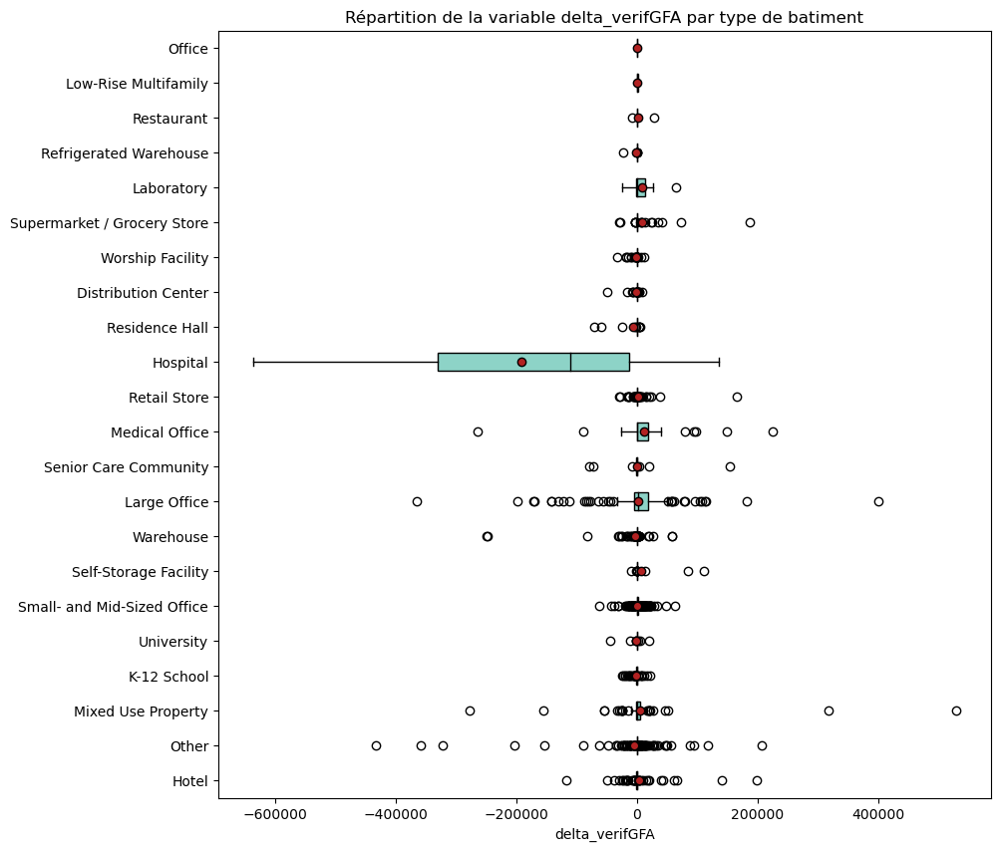

In [35]:
# df_filtre = building_energy[building_energy['PropertyGFAParking'] > 0]

# Répartition de la variable 'PropertyGFATotal' par type de batiment :
y = 'PrimaryPropertyType' # qualitative
x = 'delta_verifGFA' # quantitative

modalites = building_energy[y].unique()
groupes = []
for m in modalites:
    groupes.append(building_energy[building_energy[y]==m][x])

# Propriétés graphiques 
plt.figure(figsize=(10, 10))
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
plt.title(f"Répartition de la variable {x} par type de batiment")
plt.xlabel(f'{x}')
plt.boxplot(groupes, labels=modalites, showfliers=True, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)

plt.show()

PrimaryPropertyType - LargestPropertyUseType - SecondLargestPropertyUseType - ThirdLargestPropertyUseType

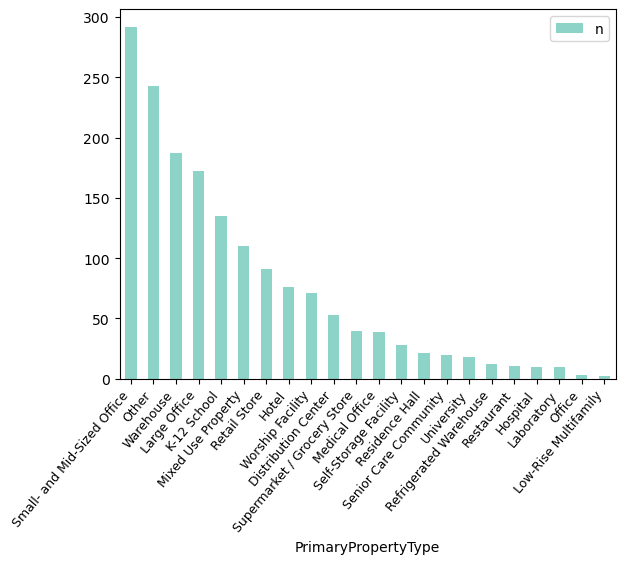

In [36]:
# Aperçu de la variable :
effectifs = building_energy['PrimaryPropertyType'].value_counts()
modalites = effectifs.index # l'index de effectifs contient les modalités
tab = pd.DataFrame(modalites, columns = ['PrimaryPropertyType']) # Création du tableau à partir des modalités
tab["n"] = effectifs.values
tab.plot(kind='bar',y='n',x='PrimaryPropertyType')
plt.xticks(rotation=50, fontsize=9, ha='right')
plt.show()

In [37]:
X = "LargestPropertyUseType"
Y = "PrimaryPropertyType"

cont = building_energy[[X,Y]].pivot_table(index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total")
cont

PrimaryPropertyType,Distribution Center,Hospital,Hotel,K-12 School,Laboratory,Large Office,Low-Rise Multifamily,Medical Office,Mixed Use Property,Office,...,Restaurant,Retail Store,Self-Storage Facility,Senior Care Community,Small- and Mid-Sized Office,Supermarket / Grocery Store,University,Warehouse,Worship Facility,Total
LargestPropertyUseType,,,,,,,,,,,,,,,,,,,,,
Adult Education,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
Automobile Dealership,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
Bank Branch,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
College/University,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,18.0,NaN,NaN,18
Convention Center,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
Courthouse,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
Data Center,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
Distribution Center,53.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54
Financial Office,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4


<div class="alert alert-block alert-info">
        <b> BILAN : </b> 

- la somme des surfaces LargestPropertyUseType, second et third n'est pas totalement égale à la surface totale du bâtiment
    
- certaines surfaces sont sans doute comptés dans plusieurs usages
    
- les hopitaux présentent des incohérences sur ces variables

- les variables "LargestPropertyUseType" et "PrimaryPropertyType" sont très liées

--> je laisse de côté pour le moment les variables Largest,Second et Third property use ainsi que les variables de surface associées.
</div>

#### -- Etude des variables d'énergie --

SteamUse (kBtu) + Electricity(kBtu) + NaturalGas(kBtu) = SiteEnergyUse (kBtu)

In [38]:
# SteamUse (kBtu) + Electricity(kBtu) + NaturalGas(kBtu) = SiteEnergyUse (kBtu) et faire une part de chaque source d'énergie
# Un kBtu représente mille British thermal units = 1 kBtu équivaut à environ 1,05506 mégajoules (MJ)
# Il faudrait environ 360 mégajoules pour chauffer une maison de 100 m² pendant une journée.
building_energy['verif'] = (building_energy['SteamUse(kBtu)'].fillna(0) +
                                 building_energy['Electricity(kBtu)'].fillna(0) +
                                 building_energy['NaturalGas(kBtu)'].fillna(0))
building_energy['delta_verif'] = building_energy['SiteEnergyUse(kBtu)'] - building_energy['verif']
building_energy['delta_verif'].describe()

count    1.642000e+03
mean     3.233890e+04
std      8.611993e+05
min     -4.993620e+06
25%      0.000000e+00
50%      2.500000e-01
75%      7.500000e-01
max      2.255370e+07
Name: delta_verif, dtype: float64

<Axes: xlabel='delta_verif', ylabel='Count'>

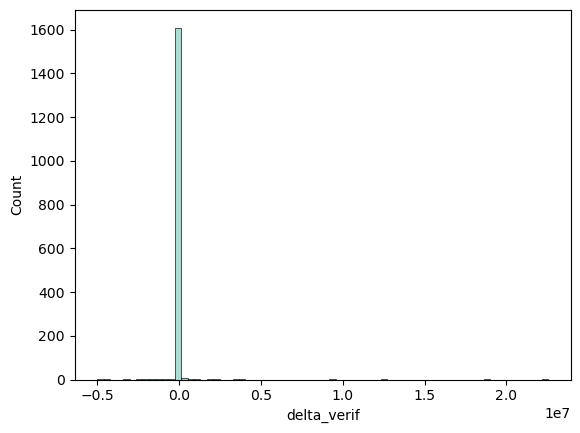

In [39]:
sns.histplot(data=building_energy, x='delta_verif', bins=70)

In [40]:
# Selection du df pour lequel building_energy['delta_verif'] est < -100 ou > 100
selection = building_energy.loc[(building_energy['delta_verif'] < -100) | (building_energy['delta_verif'] > 100)]
columns = ['SiteEnergyUse(kBtu)','delta_verif']
selection[columns].head(38) # 38 batiments qui sont incohérents
# selection.shape

,SiteEnergyUse(kBtu),delta_verif
31,0.000000e+00,-1.496816e+06
62,0.000000e+00,-6.008130e+05
69,2.365898e+07,2.458002e+06
70,8.141156e+06,2.669105e+05
71,2.095503e+07,3.939011e+06
73,2.726369e+06,2.306400e+05
75,2.072325e+07,2.073342e+06
81,0.000000e+00,-1.698176e+06
85,0.000000e+00,-2.347138e+06
95,0.000000e+00,-2.104286e+06


<div class="alert alert-block alert-info">
        <b> BILAN : </b> Supprimer les bâtiments qui présentent des incohérences dans les mesures d'énergie, pour lequels l'écart entre la sommes des énergies consommées et l'énergie consommée totale est important (écart absolu > 100 kBtu).
</div>

#### --> Vérification des doublons

In [41]:
# On vérifie s'il n'y a pas de doublon
building_energy.duplicated().sum()

0

### 4. Choix des deux cibles pour les prédictions

<div class="alert alert-block alert-info">
    
##### Pour prédire les émissions de CO2 : 
TotalGHGEmissions
##### Pour prédire la consommation totale d'énergie : 
SiteEnergyUse(kBtu)
    
</div>

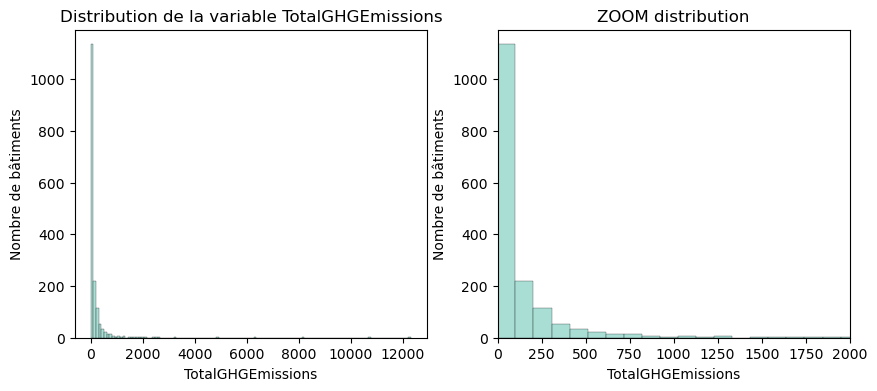

In [42]:
# Aperçu de la distribution de ma variable cible
fig, axs = plt.subplots(1, 2, figsize=(10,4))
sns.histplot(building_energy, x='TotalGHGEmissions', bins=120, ax=axs[0])
axs[0].set_title('Distribution de la variable TotalGHGEmissions')
axs[0].set_ylabel('Nombre de bâtiments') 
axs[0].set_xlabel("TotalGHGEmissions",fontsize=10) 

sns.histplot(building_energy, x='TotalGHGEmissions', bins=120, ax=axs[1])
axs[1].set_title('ZOOM distribution')
axs[1].set_ylabel('Nombre de bâtiments') 
axs[1].set_xlabel("TotalGHGEmissions",fontsize=10) 

plt.xlim(0, 2000)
plt.show()

In [43]:
base_triee = building_energy.sort_values(by='TotalGHGEmissions', ascending=True)
base_triee['TotalGHGEmissions'].head(10)

3206   -0.80
1361    0.00
152     0.00
746     0.00
513     0.00
28      0.00
304     0.00
2189    0.12
1229    0.17
1295    0.31
Name: TotalGHGEmissions, dtype: float64

In [44]:
building_energy['TotalGHGEmissions'].describe()

count     1642.000000
mean       160.501760
std        554.183554
min         -0.800000
25%         19.780000
50%         49.105000
75%        134.815000
max      12307.160000
Name: TotalGHGEmissions, dtype: float64

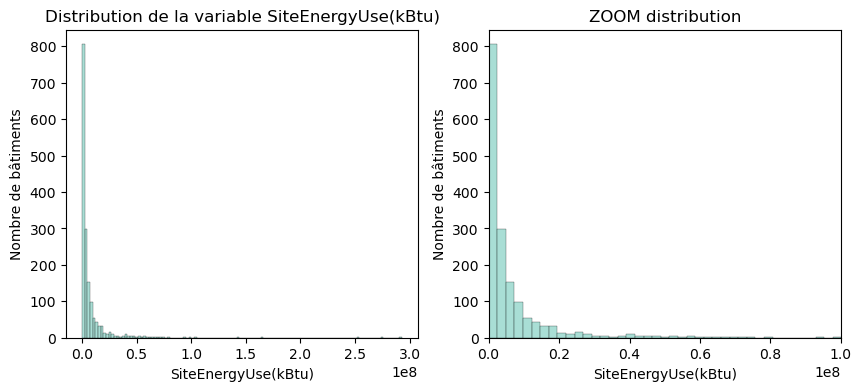

In [45]:
# Aperçu de la distribution de ma variable cible
fig, axs = plt.subplots(1, 2, figsize=(10,4))
sns.histplot(building_energy, x='SiteEnergyUse(kBtu)', bins=120, ax=axs[0])
axs[0].set_title('Distribution de la variable SiteEnergyUse(kBtu)')
axs[0].set_ylabel('Nombre de bâtiments') 
axs[0].set_xlabel("SiteEnergyUse(kBtu)",fontsize=10) 

sns.histplot(building_energy, x='SiteEnergyUse(kBtu)', bins=120, ax=axs[1])
axs[1].set_title('ZOOM distribution')
axs[1].set_ylabel('Nombre de bâtiments') 
axs[1].set_xlabel("SiteEnergyUse(kBtu)",fontsize=10) 

plt.xlim(0, 100000000)
plt.show()

In [46]:
building_energy['SiteEnergyUse(kBtu)'].describe()

count    1.642000e+03
mean     7.373224e+06
std      1.814333e+07
min      0.000000e+00
25%      1.215744e+06
50%      2.498541e+06
75%      6.785911e+06
max      2.930908e+08
Name: SiteEnergyUse(kBtu), dtype: float64

In [47]:
base_triee = building_energy.sort_values(by='SiteEnergyUse(kBtu)', ascending=True)
base_triee['SiteEnergyUse(kBtu)'].head(20)

133         0.00000
304         0.00000
62          0.00000
1361        0.00000
1894        0.00000
614         0.00000
81          0.00000
31          0.00000
28          0.00000
746         0.00000
3166        0.00000
630         0.00000
95          0.00000
85          0.00000
139         0.00000
152         0.00000
2189    16808.90039
1229    24105.50000
1295    44293.50000
1577    57133.19922
Name: SiteEnergyUse(kBtu), dtype: float64

--------------------
SiteEnergyUse(kBtu)


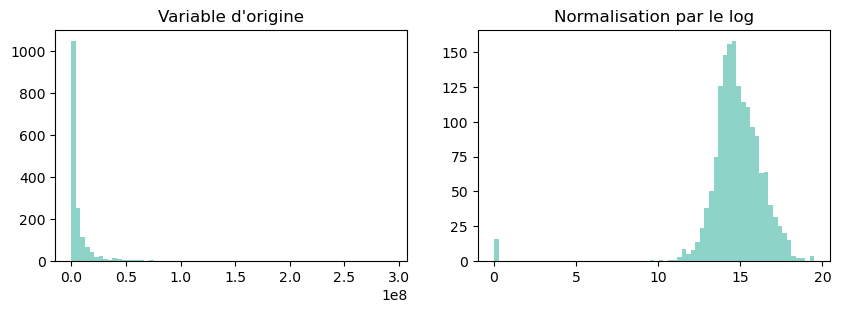

--------------------
TotalGHGEmissions


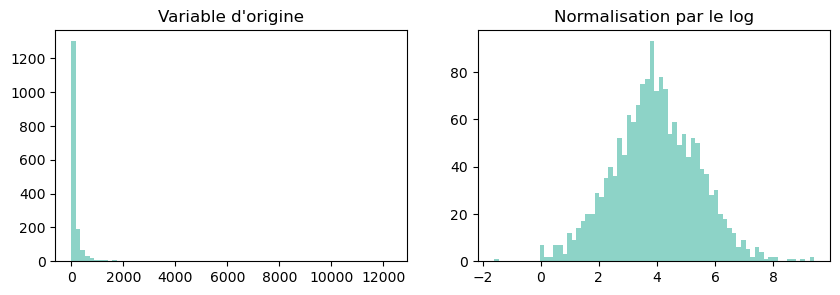

In [48]:
# Le passage au log des 2 variables permettra d'obtenir une dispersion plus homogène
var_num = ['SiteEnergyUse(kBtu)','TotalGHGEmissions']

for variable in var_num:
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
    print("-"*20)
    print(variable)
    
    axs[0].hist(building_energy[variable], bins=70)
    axs[0].set_title("Variable d'origine")
    
    filtered_series = (building_energy[variable].dropna().astype(float)+1)
    var_log = filtered_series.apply(lambda x: log(x))
    axs[1].hist(var_log, bins=70)
    axs[1].set_title("Normalisation par le log")
    
    plt.show()

<div class="alert alert-block alert-info">
        <b> BILAN : </b> Après nettoyage du dataset (bâtiments qui présentent des incohérences) il faudra prêter attention aux valeurs nulles des 2 targets et passer la variable en log.
</div>

### 5. Fonction de nettoyage du dataset

In [49]:
# Liste des variables à traiter :
variables_a_supprimer = ['PropertyName', 'Address', 'TaxParcelIdentificationNumber','Electricity(kWh)','NaturalGas(therms)','DataYear','Comments','State',
                         'City','ListOfAllPropertyUseTypes','YearsENERGYSTARCertified','DefaultData','Outlier',
                         'ComplianceStatus','delta_verifGFA','verifGFA','delta_verif','verif']
var_object = ['OSEBuildingID','CouncilDistrictCode','ZipCode']
var_mesures_a_supp = ['SiteEUI(kBtu/sf)','SiteEUIWN(kBtu/sf)','SourceEUIWN(kBtu/sf)','GHGEmissionsIntensity',
                      'SiteEnergyUseWN(kBtu)','SourceEUI(kBtu/sf)']

In [50]:
def preProcessing (df_brut):
    """ Définition de la fonction preProcessing qui va :
            1. Filtrer sur les batiments classés 'ComplianceStatus' = compliante 
            2. Supprimer les bâtiments qui présentent des incohérences dans les mesures d'énergie
            3. Supprimer les variables inutiles et les mesures non concervées pour les prédictions
            4. Transformer la nature des variables """
    
    # 1. Filtre sur les batiments classés 'ComplianceStatus' = compliante
    df_filtre = df_brut[df_brut['ComplianceStatus'] == 'Compliant'].copy()
    
    # 2. Suppression des bâtiments qui présentent des incohérences dans les mesures d'énergie
    df_filtre = df_filtre.loc[(df_filtre['delta_verif'] > -100) & (df_filtre['delta_verif'] < 100)]
    
    # 3. Supprimer les variables inutiles et les mesures non concervées pour les prédictions
    df_filtre = df_filtre.drop(columns=variables_a_supprimer, inplace=False)
    df_filtre = df_filtre.drop(columns=var_mesures_a_supp, inplace=False)
    
    # 4. Transformer la nature des variables en object
    df_filtre[var_object] = df_filtre[var_object].astype(str)
        
    return df_filtre

In [51]:
# On applique la fonction preProcessinf à notre jeu de données :
building_energy_CLEAN = preProcessing(building_energy)
building_energy_CLEAN.shape

(1498, 32)

### 6. Etude des valeurs manquantes et premières étapes du feature engineering

#### --> Identification et analyse des valeurs manquantes

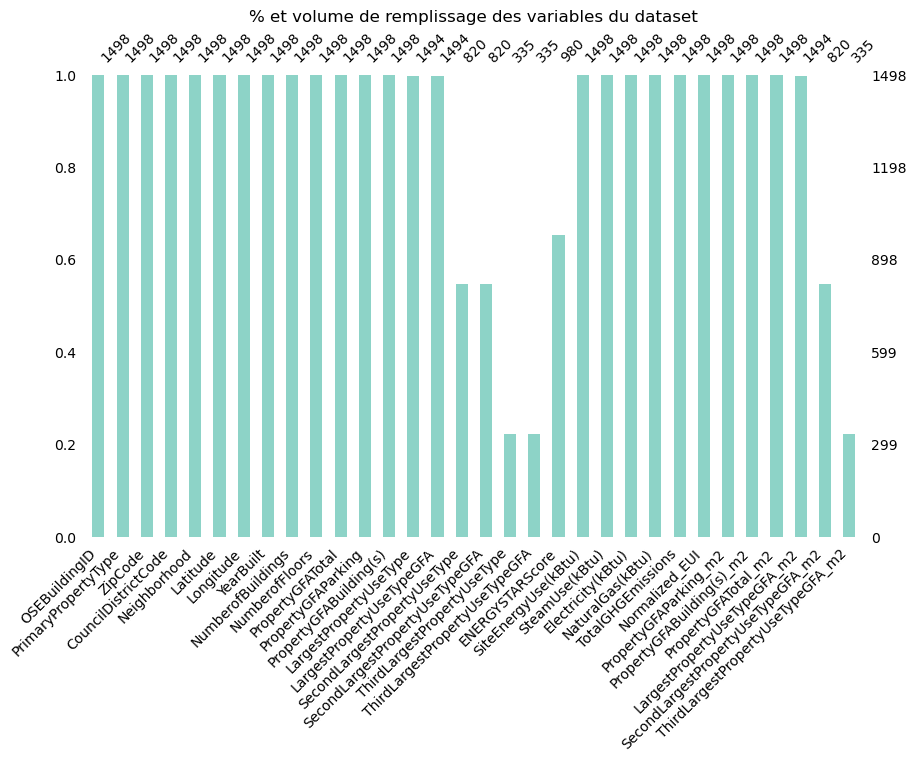

In [52]:
# Afficher la complétude des variables du data set filtré :
msno.bar(building_energy_CLEAN, color='#8dd3c7',figsize=(10, 6),fontsize=10)
plt.title('% et volume de remplissage des variables du dataset', fontsize=12)
plt.show()

<div class="alert alert-block alert-info">
        <b> BILAN : </b> 
Les seules variables qui présentent des valeurs manquantes sont :
    
- les variables usage du bâtiment avec la surface que nous n'allons pas utiliser pour le moment
    
- le score EnergyStar qu'on gardera en l'état pour le moment également.
</div>

#### --> Création de la variable Parking Y/N

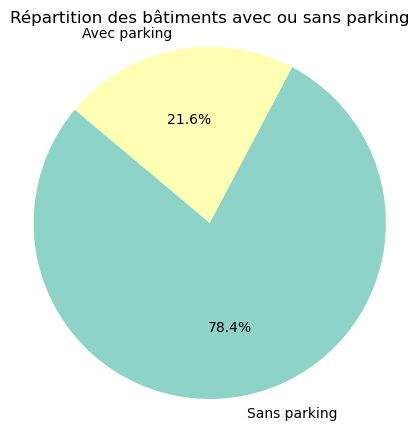

In [53]:
# Création d'une variable Parking 0/1
building_energy_CLEAN['Parking_yes_no'] = (building_energy_CLEAN['PropertyGFAParking'] != 0).astype(int)
# Calculer les effectifs de chaque catégorie
counts = building_energy_CLEAN['Parking_yes_no'].value_counts()

# Créer un pie chart
plt.figure(figsize=(5, 5))
plt.pie(counts, labels=['Sans parking', 'Avec parking'], autopct='%1.1f%%', startangle=140)
plt.title('Répartition des bâtiments avec ou sans parking')
plt.axis('equal')  # Pour assurer que le pie chart est dessiné comme un cercle
plt.show()

#### --> Création d'une variable part d'énergie totale

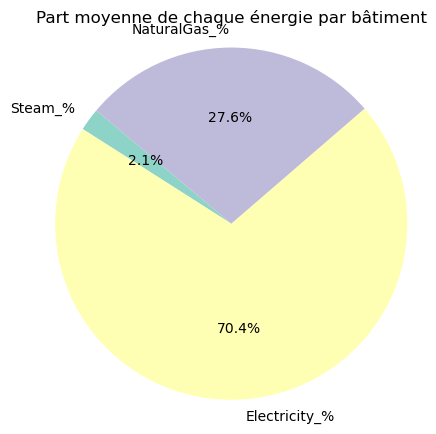

In [54]:
# SteamUse (kBtu) + Electricity(kBtu) + NaturalGas(kBtu) = SiteEnergyUse (kBtu) et faire une part de chaque source d'énergie
building_energy_CLEAN['Steam_%'] = building_energy_CLEAN['SteamUse(kBtu)'] / building_energy_CLEAN['SiteEnergyUse(kBtu)']
building_energy_CLEAN['Electricity_%'] = building_energy_CLEAN['Electricity(kBtu)'] / building_energy_CLEAN['SiteEnergyUse(kBtu)']
building_energy_CLEAN['NaturalGas_%'] = building_energy_CLEAN['NaturalGas(kBtu)'] / building_energy_CLEAN['SiteEnergyUse(kBtu)']

pct = [building_energy_CLEAN['Steam_%'].mean(), building_energy_CLEAN['Electricity_%'].mean(), building_energy_CLEAN['NaturalGas_%'].mean()]

plt.figure(figsize=(5, 5))
plt.pie(pct, labels=['Steam_%', 'Electricity_%', 'NaturalGas_%'], autopct='%1.1f%%', startangle=140)
plt.title('Part moyenne de chaque énergie par bâtiment')
plt.axis('equal')  # Pour assurer que le pie chart est dessiné comme un cercle
plt.show()

#### --> Changement de la variable YearBuilt en age du bâtiment

In [55]:
# Obtenir l'année actuelle
current_year = datetime.now().year

# Calculer l'âge du bâtiment en soustrayant l'année de construction de l'année actuelle
building_energy_CLEAN['Age_batiment'] = current_year - building_energy_CLEAN['YearBuilt']

# Afficher les premières lignes pour vérifier
print(building_energy_CLEAN[['YearBuilt', 'Age_batiment']].head())

   YearBuilt  Age_batiment
0       1927            97
1       1996            28
2       1969            55
3       1926            98
4       1980            44


In [56]:
building_energy_CLEAN.drop(columns=['YearBuilt'], inplace=True)

#### --> Encodage des variables 'PrimaryPropertyType', 'LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType'

2 méthodes possibles : pd.get_dummies() (=méthode de pandas) ou OneHotEncoder() (méthode de la librairie Scikit-learn) = pour transformer une variable catégorielle de n modalitées en n variables binaires

Une autre méthode existe pour limiter la création de variable = encodage binaire de la librairie category_encoders (from sklearn.preprocessing import TargetEncoder).

L'énorme avantage de l’encodage binaire sur le one hot encoding est la réduction drastique du nombre de variables nécessaires pour encoder la variable catégorique originale.

On aurait aussi pu utiliser from sklearn.feature_extraction import DictVectorizer

In [57]:
# 'PrimaryPropertyType' et 'LargestPropertyUseType'
# Utiliser get_dummies pour créer les variables indicatrices
dummies = pd.get_dummies(building_energy_CLEAN, columns=['PrimaryPropertyType','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType'], prefix=['PPT','LPUT','SLPUT','TLPUT'], prefix_sep='_', dtype=int)
selected_dummies = dummies.filter(regex='^(PPT|LPUT|SLPUT|TLPUT)_')

# Concaténer les variables indicatrices avec le DataFrame d'origine
building_energy_CLEAN = pd.concat([building_energy_CLEAN, selected_dummies], axis=1)

In [58]:
# from sklearn.preprocessing import OneHotEncoder
# OneHotEncoder(*, categories='auto', drop=None, sparse=True, dtype=<class 'numpy.float64'>, handle_unknown='error')

#### --> Changement en log des variables TARGET

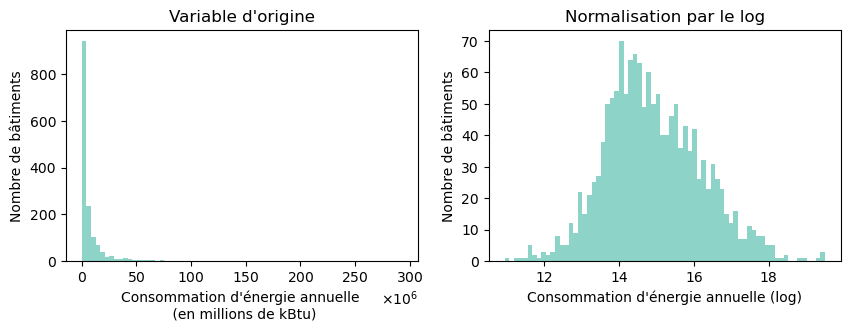

In [83]:
# Le passage au log des 2 variables permettra d'obtenir une dispersion plus homogène
var_num = ['SiteEnergyUse(kBtu)','TotalGHGEmissions']

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
    
axs[0].hist(building_energy_CLEAN[var_num[0]], bins=70)
axs[0].set_title("Variable d'origine")
axs[0].set_ylabel('Nombre de bâtiments') 
axs[0].set_xlabel("Consommation d'énergie annuelle \n (en millions de kBtu)",fontsize=10) 
axs[0].xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
axs[0].ticklabel_format(axis='x', style='sci', scilimits=(6,6))
    
filtered_series = (building_energy_CLEAN[var_num[0]].dropna().astype(float)+1)
var_log = filtered_series.apply(lambda x: log(x))
axs[1].hist(var_log, bins=70)
axs[1].set_title("Normalisation par le log")
axs[1].set_ylabel('Nombre de bâtiments') 
axs[1].set_xlabel("Consommation d'énergie annuelle (log)",fontsize=10) 
    
plt.show()

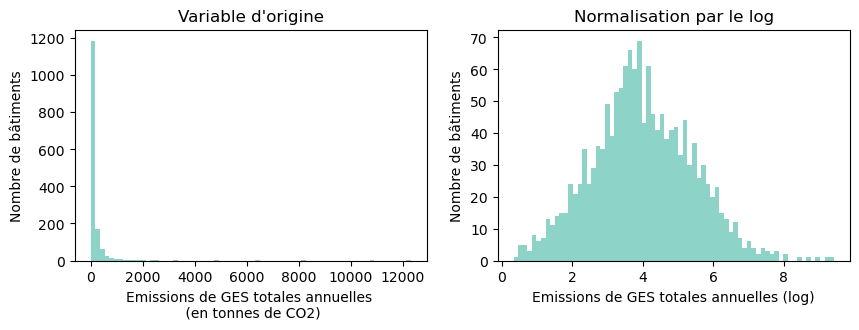

In [88]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 3))
    
axs[0].hist(building_energy_CLEAN[var_num[1]], bins=70)
axs[0].set_title("Variable d'origine")
axs[0].set_ylabel('Nombre de bâtiments') 
axs[0].set_xlabel("Emissions de GES totales annuelles \n (en tonnes de CO2)",fontsize=10) 
    
filtered_series = (building_energy_CLEAN[var_num[1]].dropna().astype(float)+1)
var_log = filtered_series.apply(lambda x: log(x))
axs[1].hist(var_log, bins=70)
axs[1].set_title("Normalisation par le log")
axs[1].set_ylabel('Nombre de bâtiments') 
axs[1].set_xlabel("Emissions de GES totales annuelles (log)",fontsize=10) 
    
plt.show()

### 7. Explorez les relations potentielles entre les variables et les TARGET

In [60]:
building_energy_CLEAN.columns[0:40]

Index(['OSEBuildingID', 'PrimaryPropertyType', 'ZipCode',
       'CouncilDistrictCode', 'Neighborhood', 'Latitude', 'Longitude',
       'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions',
       'Normalized_EUI', 'PropertyGFAParking_m2', 'PropertyGFABuilding(s)_m2',
       'PropertyGFATotal_m2', 'LargestPropertyUseTypeGFA_m2',
       'SecondLargestPropertyUseTypeGFA_m2',
       'ThirdLargestPropertyUseTypeGFA_m2', 'Parking_yes_no', 'Steam_%',
       'Electricity_%', 'NaturalGas_%', 'Age_batiment',
       'PPT_Distribution Center', 'PPT_Hospital', 'PPT_Hotel',
       'PPT_K-12 School'],
 

In [61]:
var_explicatives_categ = ['PrimaryPropertyType','LargestPropertyUseType','Parking_yes_no']

var_explicatives_num = ['PropertyGFATotal', 'PropertyGFAParking', 'PropertyGFABuilding(s)',
                        'ENERGYSTARScore','Steam_%','Electricity_%','NaturalGas_%','NumberofBuildings','NumberofFloors',
                        'Latitude','Longitude', 'Age_batiment']

var_cibles = ['TotalGHGEmissions','SiteEnergyUse(kBtu)']

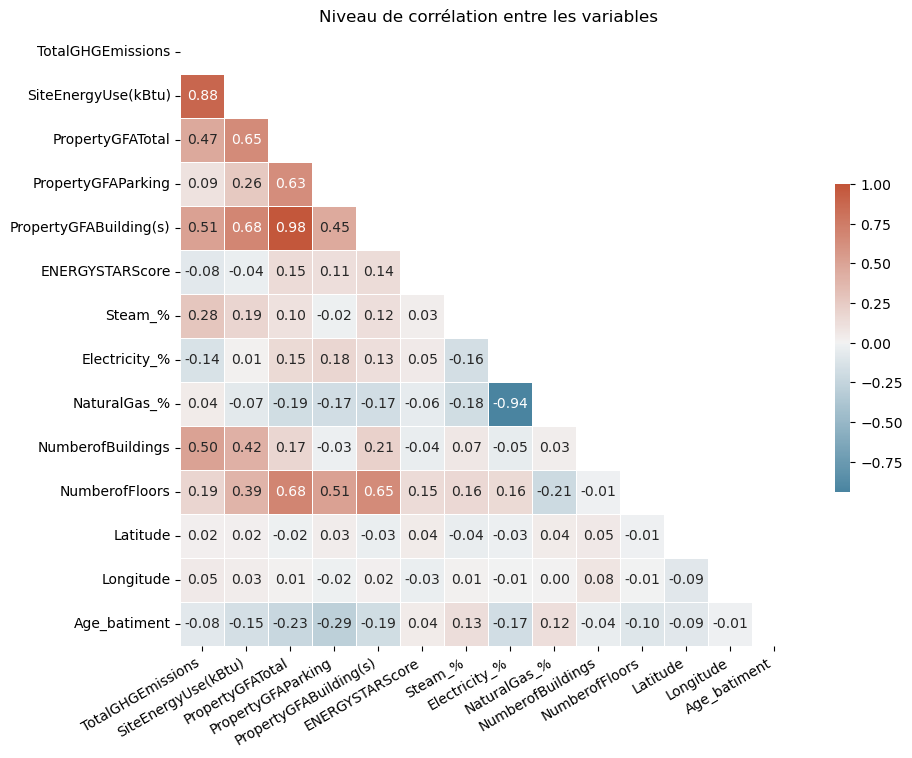

In [62]:
var_a_etudier = var_cibles + var_explicatives_num

# Compute the correlation matrix
corr = building_energy_CLEAN[var_a_etudier].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(10, 8))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f", annot_kws={"size": 10})

plt.xticks(rotation=30, ha='right')

plt.title('Niveau de corrélation entre les variables')
plt.show()

<div class="alert alert-block alert-info">
        <b> BILAN : </b> 
Corrélations entre les variables :
    
- les variables target sont corrélées avec les variables de surfaces qui vont donc jouer un rôle important dans le modèle.
- la corrélation maximale entre les variables et nos 2 targets cibles est de 0.68 
- les variables les plus corrélées sont les variables de surface entre elles et avec la structure du bâtiment.
   
<b>--> pas de problème de data leakage </b>  (c'est-à-dire, des variables trop corrélées à la variable cible et inconnues a priori dans les données en entrée du modèle). 
</div>

--------------------
PrimaryPropertyType
Eta carré entre la variable PrimaryPropertyType et SiteEnergyUse(kBtu) est : 0.4226459851830512


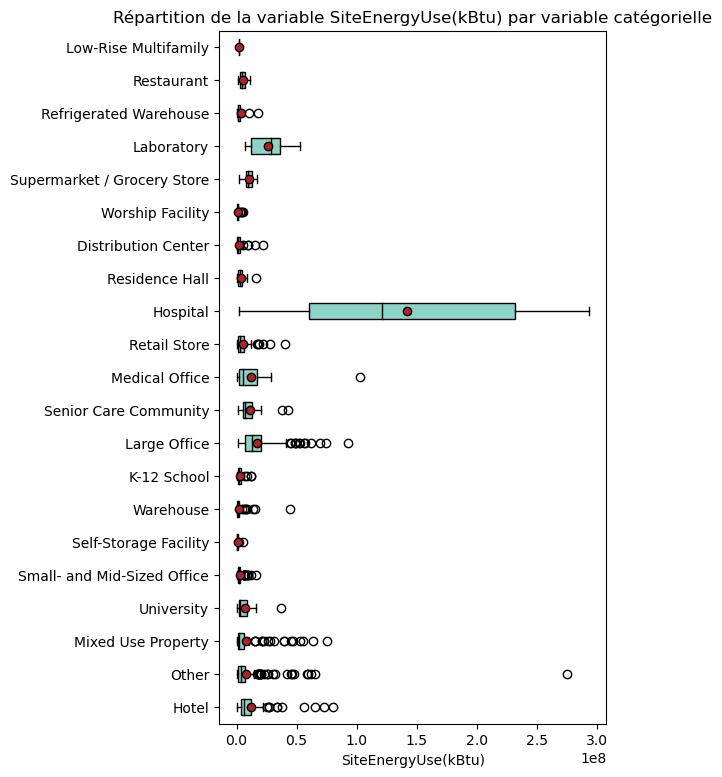

--------------------
LargestPropertyUseType
Eta carré entre la variable LargestPropertyUseType et SiteEnergyUse(kBtu) est : nan


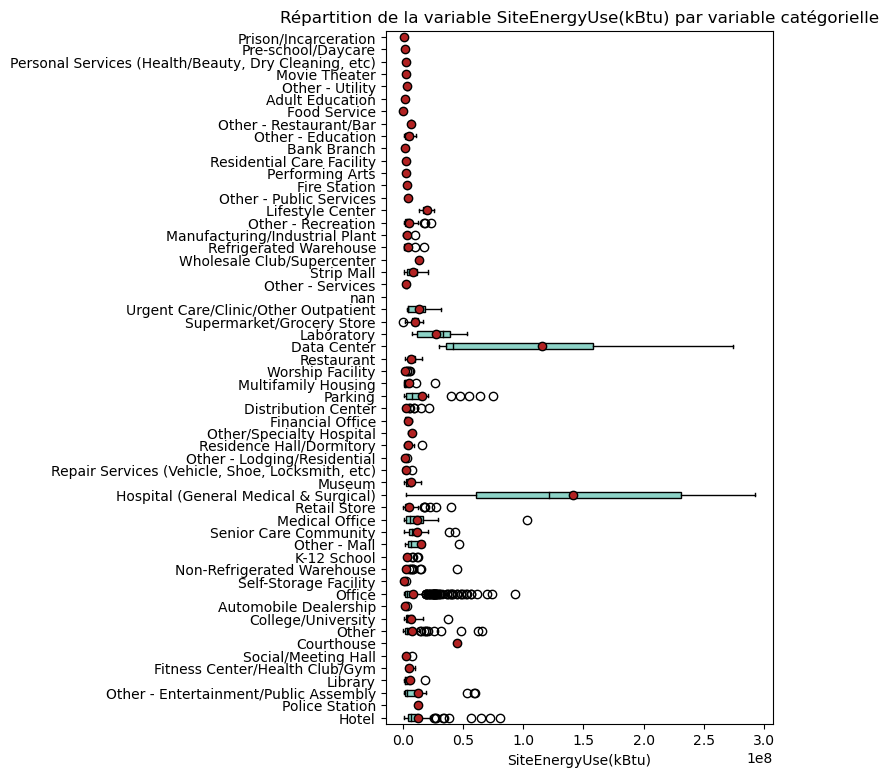

In [63]:
# Croisement des variables catégorielles avec la variable 'SiteEnergyUse(kBtu)'
var_expli = ['PrimaryPropertyType','LargestPropertyUseType']

# Afficher la répartition des variables cibles pour chaque variable catégorielle :
for variable in var_expli:
    
    print("-"*20)
    print(variable)

    y = variable # qualitative
    x = 'SiteEnergyUse(kBtu)' # quantitative
    
    print(f"Eta carré entre la variable {variable} et {x} est : {eta_squared(building_energy_CLEAN[y],building_energy_CLEAN[x])}")
        
    modalites = building_energy_CLEAN[y].unique()
    groupes = []
    for m in modalites:
        groupes.append(building_energy_CLEAN[building_energy_CLEAN[y]==m][x])

    # Propriétés graphiques 
    plt.figure(figsize=(5, 9))
    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    plt.title(f"Répartition de la variable {x} par variable catégorielle")
    plt.xlabel(f'{x}')
    plt.boxplot(groupes, labels=modalites, showfliers=True, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
    axs[0].set_xlabel("Consommation d'énergie annuelle \n (en millions de kBtu)",fontsize=10) 
    axs[0].xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    axs[0].ticklabel_format(axis='x', style='sci', scilimits=(6,6))

    plt.show()

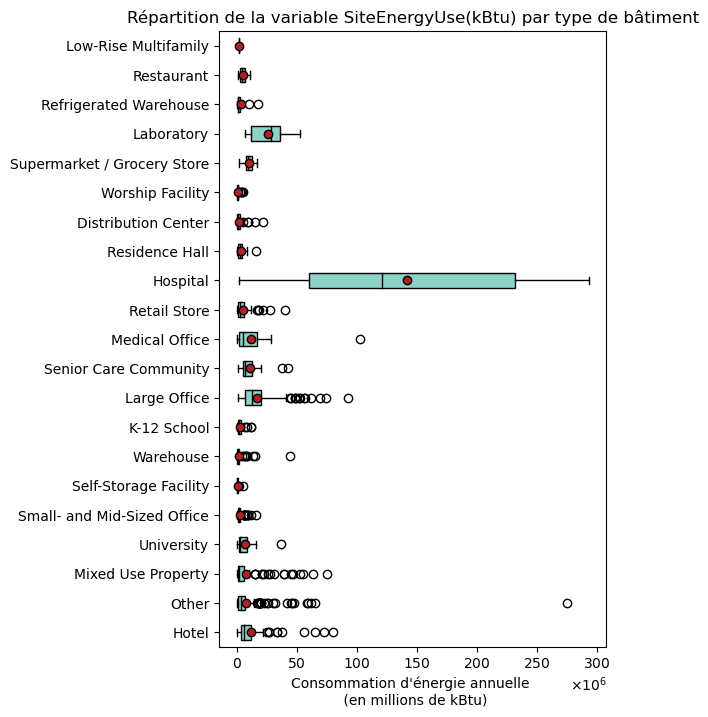

In [96]:
# Croisement des variables catégorielles avec la variable 'SiteEnergyUse(kBtu)'
var_expli = ['PrimaryPropertyType','LargestPropertyUseType']

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(5, 8))

y = var_expli[0] # qualitative
x = 'SiteEnergyUse(kBtu)' # quantitative
    
modalites = building_energy_CLEAN[y].unique()
groupes = []
for m in modalites:
    groupes.append(building_energy_CLEAN[building_energy_CLEAN[y]==m][x])

# Propriétés graphiques 
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
axs.set_title(f"Répartition de la variable {x} par type de bâtiment")
axs.set_xlabel("Consommation d'énergie annuelle \n (en millions de kBtu)")
axs.boxplot(groupes, labels=modalites, showfliers=True, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
axs.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
axs.ticklabel_format(axis='x', style='sci', scilimits=(6,6))

plt.show()

--------------------
PrimaryPropertyType
Eta carré entre la variable PrimaryPropertyType et TotalGHGEmissions est : 0.5209661418747136


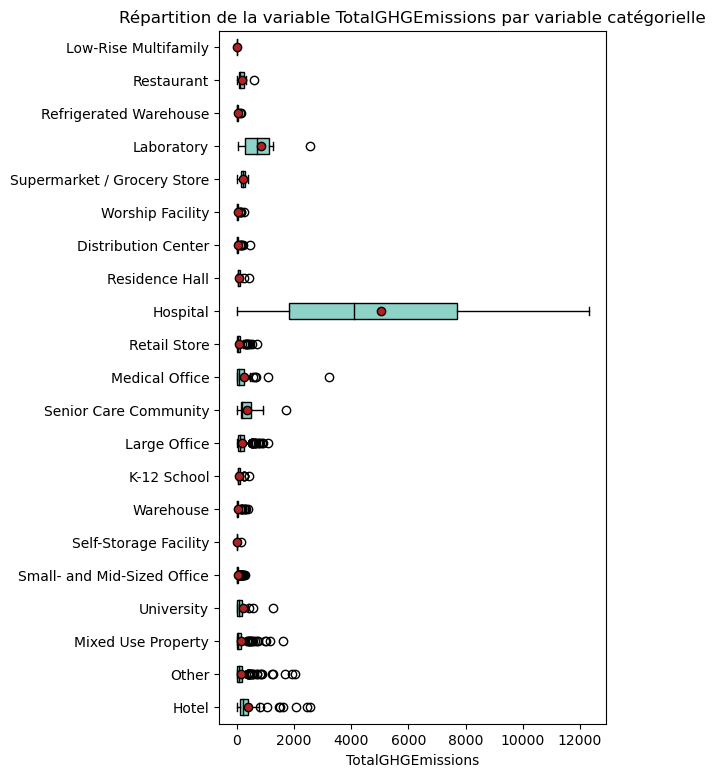

--------------------
LargestPropertyUseType
Eta carré entre la variable LargestPropertyUseType et TotalGHGEmissions est : nan


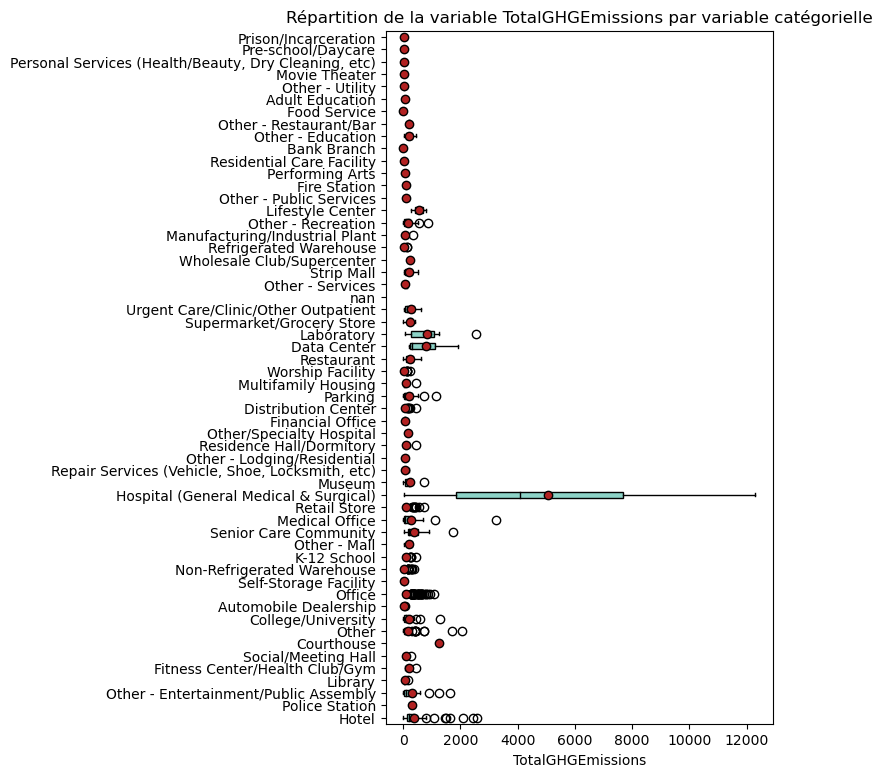

In [64]:
# Croisement des variables catégorielles avec la variable 'SiteEnergyUse(kBtu)'
var_expli = ['PrimaryPropertyType','LargestPropertyUseType']

# Afficher la répartition des variables cibles pour chaque variable catégorielle :
for variable in var_expli:
    
    print("-"*20)
    print(variable)

    y = variable # qualitative
    x = 'TotalGHGEmissions' # quantitative
    
    print(f"Eta carré entre la variable {variable} et {x} est : {eta_squared(building_energy_CLEAN[y],building_energy_CLEAN[x])}")
        
    modalites = building_energy_CLEAN[y].unique()
    groupes = []
    for m in modalites:
        groupes.append(building_energy_CLEAN[building_energy_CLEAN[y]==m][x])

    # Propriétés graphiques 
    plt.figure(figsize=(5, 9))
    medianprops = {'color':"black"}
    meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}
    plt.title(f"Répartition de la variable {x} par variable catégorielle")
    plt.xlabel(f'{x}')
    plt.boxplot(groupes, labels=modalites, showfliers=True, medianprops=medianprops, 
            vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)

    plt.show()

In [65]:
# Combien y a-il de PrimaryPropertyType == 'Hospital' et LargestPropertyUseType == 'Hospital (General Medical & Surgical)', 'Data Center'
print(building_energy_CLEAN['PPT_Hospital'].sum(),building_energy_CLEAN['LPUT_Hospital (General Medical & Surgical)'].sum(),building_energy_CLEAN['LPUT_Data Center'].sum())

10 10 3


<div class="alert alert-block alert-info">
        <b> BILAN : </b>  
- pour les 2 variables target, la distribution des données des bâtiment "hopitaux" ne suivent pas la même distribution que l'ensemble des données
- cela va créer un déséquilibre dans le modèle, il faudra sans doute les retirer du dataset (à voir après un premier test).
- il y a également le bâtiment index = 558 classé en autres qui présente une valeur atypique, à retirer éventuellement.
</div>

In [66]:
# Filtrer le jeu de données sans la catégorie 'Hospital'
building_energy_FILTERED = building_energy_CLEAN[building_energy_CLEAN['PPT_Hospital'] == 0]
building_energy_FILTERED.shape

(1488, 196)

SiteEnergyUse(kBtu)


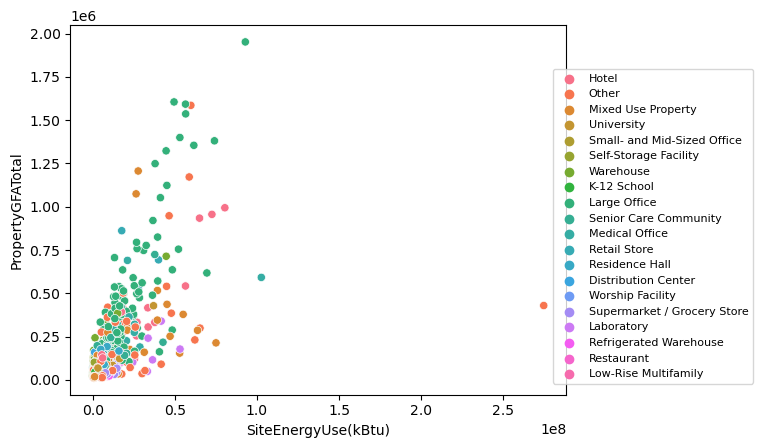

In [67]:
# Nuages de points avec la variable 'SiteEnergyUse(kBtu)'
print('SiteEnergyUse(kBtu)')
ax=sns.scatterplot(data=building_energy_FILTERED, x='SiteEnergyUse(kBtu)', y='PropertyGFATotal', hue='PrimaryPropertyType')
ax.legend(fontsize=8, bbox_to_anchor=(1.2, 0.8), bbox_transform=plt.gcf().transFigure)
plt.show()

TotalGHGEmissions


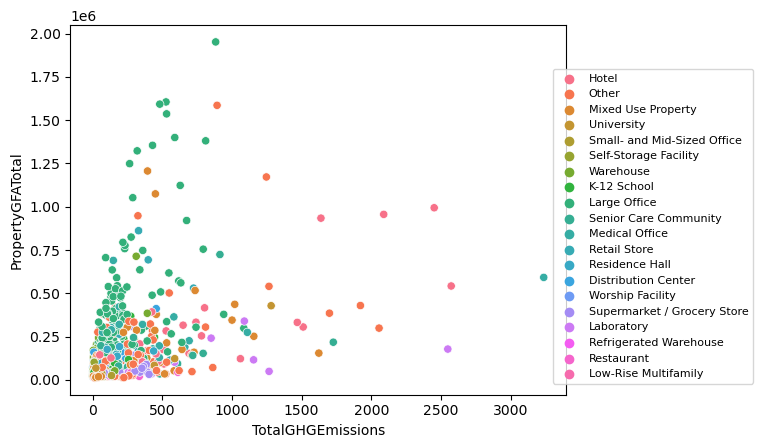

In [68]:
# Nuages de points avec la variable 'TotalGHGEmissions'
print('TotalGHGEmissions')
ax=sns.scatterplot(data=building_energy_FILTERED, x='TotalGHGEmissions', y='PropertyGFATotal', hue='PrimaryPropertyType')
ax.legend(fontsize=8, bbox_to_anchor=(1.2, 0.8), bbox_transform=plt.gcf().transFigure)
plt.show()

A noter : Une ACP n'est pas nécessaire ici, le nombre de variables n'est pas très conséquant (réduction de dimension pas utile).

### 8. Enregistrer le dataframe qui va entrer dans le modèle

In [69]:
# Constituer le jeu de données avec les variables pertinentes.
# Variables à conserver pour constituer le modèle : 
var_modele = ['Parking_yes_no', 'PropertyGFABuilding(s)', 'PropertyGFAParking', 'ENERGYSTARScore', 'Steam_%',
              'Electricity_%', 'NaturalGas_%', 'NumberofBuildings', 'NumberofFloors', 'Latitude',
              'Longitude', 'Age_batiment', 'TotalGHGEmissions', 'SiteEnergyUse(kBtu)','LargestPropertyUseTypeGFA',
             'SecondLargestPropertyUseTypeGFA','ThirdLargestPropertyUseTypeGFA','PrimaryPropertyType']
selected_var = building_energy_CLEAN.filter(regex='^PPT_|^LPUT_|^SLPUT_|^TLPUT_')

# Concaténer les colonnes sélectionnées avec les variables du modèle
df = pd.concat([building_energy_CLEAN[var_modele], selected_var], axis=1)

In [70]:
df.head()

,Parking_yes_no,PropertyGFABuilding(s),PropertyGFAParking,ENERGYSTARScore,Steam_%,Electricity_%,NaturalGas_%,NumberofBuildings,NumberofFloors,Latitude,...,TLPUT_Refrigerated Warehouse,TLPUT_Restaurant,TLPUT_Retail Store,TLPUT_Self-Storage Facility,TLPUT_Social/Meeting Hall,TLPUT_Strip Mall,TLPUT_Supermarket/Grocery Store,TLPUT_Swimming Pool,TLPUT_Vocational School,TLPUT_Worship Facility
0,0,88434,0,60.0,0.277302,0.546060,0.176638,1.0,12,47.61220,...,0,0,0,0,0,0,0,0,0,0
1,1,88502,15064,61.0,0.000000,0.386609,0.613391,1.0,11,47.61317,...,0,1,0,0,0,0,0,0,0,0
2,1,759392,196718,43.0,0.297113,0.682307,0.020579,1.0,41,47.61393,...,0,0,0,0,0,0,0,0,0,0
3,0,61320,0,56.0,0.325913,0.407519,0.266567,1.0,10,47.61412,...,0,0,0,0,0,0,0,0,0,0
4,1,113580,62000,75.0,0.000000,0.378802,0.621198,1.0,18,47.61375,...,0,0,0,0,0,0,0,1,0,0


In [71]:
# Enregistrer le dataframe pour construire le modèle
df.to_csv("C:\\Users\\druar\\OneDrive\\Documents\\01_Formations\\1_Outils_ET_Metier\\2024_DataScientist\\ProjetsPython\\P4\\data\\Building_Energy_MODELE.csv")